In [1]:
!pip install opencv-python-headless numpy pandas scikit-image matplotlib tensorflow mediapipe

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.7/13.7 MB 19.0 MB/s  0:00:00 eta 0:00:01
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
   ━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 2/4 [imageio]  WARNING: The scripts imageio_download_bin and imageio_remove_bin are installed in '/home/dev/.local/bin' which is not on PATH.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [scikit-image] [scikit-image]

[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [2]:
import sys
!{sys.executable} -m pip install opencv-python-headless numpy pandas scikit-image matplotlib tensorflow mediapipe

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [2]:
!pip install opencv-python-headless numpy pandas scikit-image matplotlib tensorflow mediapipe

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: pip install --upgrade pip


2025-12-30 14:08:23.376105: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-12-30 14:08:23.376616: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-30 14:08:23.445225: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-12-30 14:08:24.715439: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To tur

Wrote: /workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v6_centroid_noseguard.csv
Used lesion ROI: 25 / 30
Changed predictions: 9 / 30

Transition counts (face -> lesionROI v6):
pred_lesionroi_v6  mild  moderate  normal
pred_face                                
mild                 17         9       0
moderate              0         2       0
normal                0         0       2


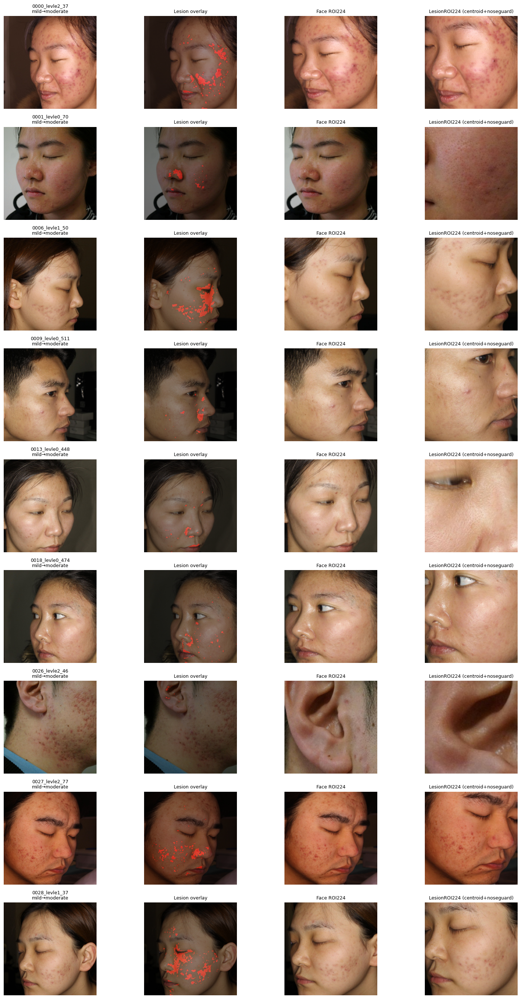

Saved grid: /workspaces/skin-app/data/segmentation/qc_v6_centroid_noseguard_grid/v6_grid_mild_to_moderate.png


In [1]:
# ============================================================
# FULL CELL (UPDATED): Face ROI vs Lesion ROI (CENTROID-CROP, NOSE-GUARDED)
# This REPLACES the previous "component-scored bbox" strategy.
#
# Outputs:
#   CSV : /workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v6_centroid_noseguard.csv
#   GRID: /workspaces/skin-app/data/segmentation/qc_v6_centroid_noseguard_grid/v6_grid_mild_to_moderate.png
# ============================================================

import cv2, numpy as np, pandas as pd
from pathlib import Path
from skimage import measure
import matplotlib.pyplot as plt
import tensorflow as tf
import mediapipe as mp
from mediapipe.tasks import python as mp_python
from mediapipe.tasks.python import vision as mp_vision

# ---------------------------
# CONFIG / PATHS
# ---------------------------
MODEL_PATH = "/workspaces/skin-app/data/artifacts/acne4_stage2_labelsmooth.keras"

IMG_DIR          = Path("/workspaces/skin-app/data/seg_qc_30")
FACE_MASK_DIR    = Path("/workspaces/skin-app/data/segmentation/facial_skin_masks_qc/masks")            # *_skinmask.png
LESION_MASK_DIR  = Path("/workspaces/skin-app/data/segmentation/qc_v3_facemask_constrained/masks")     # *_mask.png

OUT_CSV  = Path("/workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v6_centroid_noseguard.csv")
GRID_DIR = Path("/workspaces/skin-app/data/segmentation/qc_v6_centroid_noseguard_grid")
GRID_DIR.mkdir(parents=True, exist_ok=True)

CLASSES = ["normal", "mild", "moderate", "severe"]
exts = {".jpg",".jpeg",".png",".bmp",".tif",".tiff"}

# ---------------------------
# Load Model-5
# ---------------------------
model = tf.keras.models.load_model(MODEL_PATH, compile=False)

def predict_probs(bgr_224):
    x = bgr_224.astype(np.float32)[None, ...]  # model has internal rescaling
    return model.predict(x, verbose=0)[0]

# ---------------------------
# MediaPipe FaceLandmarker (Tasks API) for nose guard
# ---------------------------
MODEL_TASK = Path("/workspaces/skin-app/data/mp_models/face_landmarker.task")
assert MODEL_TASK.exists(), f"Missing FaceLandmarker model: {MODEL_TASK}"

base_options = mp_python.BaseOptions(model_asset_path=str(MODEL_TASK))
options = mp_vision.FaceLandmarkerOptions(
    base_options=base_options,
    output_face_blendshapes=False,
    output_facial_transformation_matrixes=False,
    num_faces=1
)
detector = mp_vision.FaceLandmarker.create_from_options(options)

LEFT_EYE_IDX  = [33,7,163,144,145,153,154,155,133,173,157,158,159,160,161,246]
RIGHT_EYE_IDX = [362,382,381,380,374,373,390,249,263,466,388,387,386,385,384,398]

def get_landmark_pts(bgr):
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    h,w = bgr.shape[:2]
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb)
    res = detector.detect(mp_image)
    if not res.face_landmarks:
        return None
    lms = res.face_landmarks[0]
    pts = np.array([[int(p.x * w), int(p.y * h)] for p in lms], dtype=np.int32)
    return pts

def nose_ellipse_mask_from_pts(pts, h, w):
    if pts is None or len(pts) < 10:
        return np.zeros((h,w), np.uint8)

    le = np.mean([pts[i] for i in LEFT_EYE_IDX if i < len(pts)], axis=0)
    re = np.mean([pts[i] for i in RIGHT_EYE_IDX if i < len(pts)], axis=0)
    d = float(np.linalg.norm(re - le)) + 1e-6
    angle = float(np.degrees(np.arctan2(re[1]-le[1], re[0]-le[0])))

    c = pts[1] if 1 < len(pts) else ((le + re) / 2.0)
    cx, cy = int(c[0]), int(c[1])

    ax = int(0.45 * d)  # slightly wider guard for stability
    ay = int(0.62 * d)

    m = np.zeros((h,w), np.uint8)
    cv2.ellipse(m, (cx,cy), (ax,ay), angle, 0, 360, 255, -1)
    m = cv2.dilate(m, np.ones((21,21), np.uint8), iterations=2)  # strong guard
    return m

# ---------------------------
# ROI utilities
# ---------------------------
def bbox_from_mask(mask_u8):
    ys, xs = np.where(mask_u8 > 0)
    if len(xs) == 0:
        return None
    return int(xs.min()), int(ys.min()), int(xs.max()), int(ys.max())

def crop_center_square(bgr, cx, cy, side):
    h, w = bgr.shape[:2]
    x1 = cx - side//2
    y1 = cy - side//2
    x2 = x1 + side - 1
    y2 = y1 + side - 1

    # clamp to image
    if x1 < 0: x1 = 0; x2 = side - 1
    if y1 < 0: y1 = 0; y2 = side - 1
    if x2 > w-1: x2 = w-1; x1 = w-side
    if y2 > h-1: y2 = h-1; y1 = h-side

    x1 = max(0, x1); y1 = max(0, y1)
    x2 = min(w-1, x2); y2 = min(h-1, y2)
    if x2 <= x1 or y2 <= y1:
        return None, None
    return bgr[y1:y2+1, x1:x2+1], (x1,y1,x2,y2)

def roi224_from_mask_largest(bgr, mask_u8, pad_frac=0.10):
    m = (mask_u8 > 0).astype(np.uint8)
    if m.sum() == 0:
        return None
    lab = measure.label(m, connectivity=2)
    props = measure.regionprops(lab)
    if not props:
        return None
    p = max(props, key=lambda r: r.area)
    y1,x1,y2,x2 = p.bbox
    y2 -= 1; x2 -= 1

    h,w = bgr.shape[:2]
    bw, bh = (x2-x1+1), (y2-y1+1)
    pad = int(pad_frac * max(bw,bh))
    x1 = max(0, x1-pad); y1 = max(0, y1-pad)
    x2 = min(w-1, x2+pad); y2 = min(h-1, y2+pad)

    crop = bgr[y1:y2+1, x1:x2+1]
    if crop.size == 0:
        return None
    return cv2.resize(crop, (224,224), interpolation=cv2.INTER_AREA)

def overlay_mask(bgr, mask_u8, alpha=0.40):
    out = bgr.copy()
    red = np.zeros_like(bgr)
    red[mask_u8 > 0] = (0,0,255)
    cv2.addWeighted(red, alpha, out, 1-alpha, 0, out)
    return out

# ---------------------------
# NEW Lesion ROI: centroid crop (nose-guarded) with face-bbox clamping
# ---------------------------
def roi224_centroid_crop_noseguard(
    bgr, face_u8, lesion_u8, nose_u8, face224,
    min_frac=0.0003, scale=6.0, min_rel=0.40, max_rel=0.85
):
    h, w = bgr.shape[:2]

    if face_u8 is None:
        return face224, "face_fallback_no_facemask"

    face_bb = bbox_from_mask(face_u8)
    if face_bb is None:
        return face224, "face_fallback_no_facebbox"
    fx1, fy1, fx2, fy2 = face_bb
    face_w = fx2 - fx1 + 1
    face_h = fy2 - fy1 + 1
    face_side = max(face_w, face_h)

    m = ((lesion_u8 > 0) & (face_u8 > 0)).astype(np.uint8) * 255
    if float((m > 0).mean()) < min_frac:
        return face224, "face_fallback_tiny_lesions"

    # Remove nose region only for centroid computation / ROI selection
    m2 = ((m > 0) & (nose_u8 == 0)).astype(np.uint8) * 255
    use = m2 if m2.sum() > 0 else m
    if use.sum() == 0:
        return face224, "face_fallback_empty_after_guard"

    ys, xs = np.where(use > 0)
    cx = int(xs.mean())
    cy = int(ys.mean())

    area = float(len(xs))
    side = int(np.sqrt(area) * scale)
    side = int(np.clip(side, min_rel * face_side, max_rel * face_side))
    side = max(side, 120)  # prevent tiny nose/spot crops

    # clamp centroid crop within face bbox (strong)
    cx = int(np.clip(cx, fx1 + side//2, fx2 - side//2))
    cy = int(np.clip(cy, fy1 + side//2, fy2 - side//2))

    crop, _ = crop_center_square(bgr, cx, cy, side)
    if crop is None or crop.size == 0:
        return face224, "face_fallback_bad_crop"

    roi = cv2.resize(crop, (224,224), interpolation=cv2.INTER_AREA)
    return roi, ("lesion_roi_centroid_noseguard" if m2.sum() > 0 else "lesion_roi_centroid_fallback_m")

# ---------------------------
# MAIN A/B RUN
# ---------------------------
rows = []
used_lesion = 0

for img_path in sorted(IMG_DIR.iterdir()):
    if img_path.suffix.lower() not in exts:
        continue

    bgr = cv2.imread(str(img_path))
    if bgr is None:
        continue
    h,w = bgr.shape[:2]

    # face mask
    face_path = FACE_MASK_DIR / f"{img_path.stem}_skinmask.png"
    face_u8 = cv2.imread(str(face_path), cv2.IMREAD_GRAYSCALE) if face_path.exists() else None

    # face ROI224 (baseline)
    face224 = None
    if face_u8 is not None:
        face224 = roi224_from_mask_largest(bgr, face_u8, pad_frac=0.10)
    if face224 is None:
        side0 = min(h,w)
        y1=(h-side0)//2; x1=(w-side0)//2
        face224 = cv2.resize(bgr[y1:y1+side0, x1:x1+side0], (224,224), interpolation=cv2.INTER_AREA)

    # lesion mask (already constrained segmentation)
    lesion_path = LESION_MASK_DIR / f"{img_path.stem}_mask.png"
    lesion_u8 = cv2.imread(str(lesion_path), cv2.IMREAD_GRAYSCALE) if lesion_path.exists() else np.zeros((h,w), np.uint8)

    # nose guard
    pts = get_landmark_pts(bgr)
    nose_u8 = nose_ellipse_mask_from_pts(pts, h, w)

    # lesion ROI224 (UPDATED)
    lesion224, roi_mode = roi224_centroid_crop_noseguard(
        bgr=bgr,
        face_u8=face_u8,
        lesion_u8=lesion_u8,
        nose_u8=nose_u8,
        face224=face224,
        min_frac=0.0003,
        scale=6.0,
        min_rel=0.40,
        max_rel=0.85
    )
    if roi_mode.startswith("lesion_roi_"):
        used_lesion += 1

    # predictions
    p_face = predict_probs(face224)
    p_les  = predict_probs(lesion224)

    y_face = int(np.argmax(p_face))
    y_les  = int(np.argmax(p_les))

    rows.append({
        "image": str(img_path),
        "roi_mode": roi_mode,
        "pred_face": CLASSES[y_face],
        "conf_face": float(p_face[y_face]),
        "pred_lesionroi_v6": CLASSES[y_les],
        "conf_lesionroi_v6": float(p_les[y_les]),
        "changed": int(y_face != y_les),
    })

df = pd.DataFrame(rows)
df.to_csv(OUT_CSV, index=False)

print("Wrote:", OUT_CSV)
print("Used lesion ROI:", used_lesion, "/", len(df))
print("Changed predictions:", int(df["changed"].sum()), "/", len(df))
print("\nTransition counts (face -> lesionROI v6):")
print(pd.crosstab(df["pred_face"], df["pred_lesionroi_v6"]))

# ---------------------------
# QC GRID: first 12 mild->moderate changes
# ---------------------------
chg = df[(df["pred_face"]=="mild") & (df["pred_lesionroi_v6"]=="moderate")].head(12)

plt.figure(figsize=(16, 3*max(1,len(chg))))
for i, row in enumerate(chg.itertuples(index=False), 1):
    img_path = Path(row.image)
    bgr = cv2.imread(str(img_path))
    h,w = bgr.shape[:2]

    face_u8 = cv2.imread(str(FACE_MASK_DIR / f"{img_path.stem}_skinmask.png"), cv2.IMREAD_GRAYSCALE)
    lesion_u8 = cv2.imread(str(LESION_MASK_DIR / f"{img_path.stem}_mask.png"), cv2.IMREAD_GRAYSCALE)
    ovl = overlay_mask(bgr, lesion_u8)

    face224 = roi224_from_mask_largest(bgr, face_u8, pad_frac=0.10)
    pts = get_landmark_pts(bgr)
    nose_u8 = nose_ellipse_mask_from_pts(pts, h, w)
    lesion224, _ = roi224_centroid_crop_noseguard(
        bgr=bgr, face_u8=face_u8, lesion_u8=lesion_u8, nose_u8=nose_u8, face224=face224
    )

    plt.subplot(len(chg), 4, (i-1)*4 + 1)
    plt.imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)); plt.axis("off")
    plt.title(f"{img_path.stem}\n{row.pred_face}→{row.pred_lesionroi_v6}", fontsize=9)

    plt.subplot(len(chg), 4, (i-1)*4 + 2)
    plt.imshow(cv2.cvtColor(ovl, cv2.COLOR_BGR2RGB)); plt.axis("off")
    plt.title("Lesion overlay", fontsize=9)

    plt.subplot(len(chg), 4, (i-1)*4 + 3)
    plt.imshow(cv2.cvtColor(face224, cv2.COLOR_BGR2RGB)); plt.axis("off")
    plt.title("Face ROI224", fontsize=9)

    plt.subplot(len(chg), 4, (i-1)*4 + 4)
    plt.imshow(cv2.cvtColor(lesion224, cv2.COLOR_BGR2RGB)); plt.axis("off")
    plt.title("LesionROI224 (centroid+noseguard)", fontsize=9)

plt.tight_layout()
grid_path = GRID_DIR / "v6_grid_mild_to_moderate.png"
plt.savefig(grid_path, dpi=150)
plt.show()
print("Saved grid:", grid_path)


In [2]:
!pip show opencv-python-headless

Name: opencv-python-headless
Version: 4.12.0.88
Summary: Wrapper package for OpenCV python bindings.
Home-page: https://github.com/opencv/opencv-python
Author: 
Author-email: 
License: Apache 2.0
Location: /home/dev/.local/lib/python3.11/site-packages
Requires: numpy
Required-by: 


In [3]:
%pip install opencv-python-headless

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [3]:
!pip uninstall -y opencv-python opencv-python-headless
!pip install -q "numpy==1.26.4" "opencv-python-headless==4.10.0.84"


Found existing installation: opencv-python-headless 4.12.0.88
Uninstalling opencv-python-headless-4.12.0.88:
  Successfully uninstalled opencv-python-headless-4.12.0.88
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.

[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: pip install --upgrade pip


W0000 00:00:1767104146.142739    7929 face_landmarker_graph.cc:174] Sets FaceBlendshapesGraph acceleration to xnnpack by default.
W0000 00:00:1767104146.150429    7932 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1767104146.173446    7934 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Wrote: /workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v7_landmarkbbox.csv
Used lesion ROI: 25 / 30
Changed predictions: 7 / 30

Transition counts (face -> lesionROI v7):
pred_lesionroi_v7  mild  moderate  normal
pred_face                                
mild                 18         6       0
moderate              1         3       0
normal                0         0       2


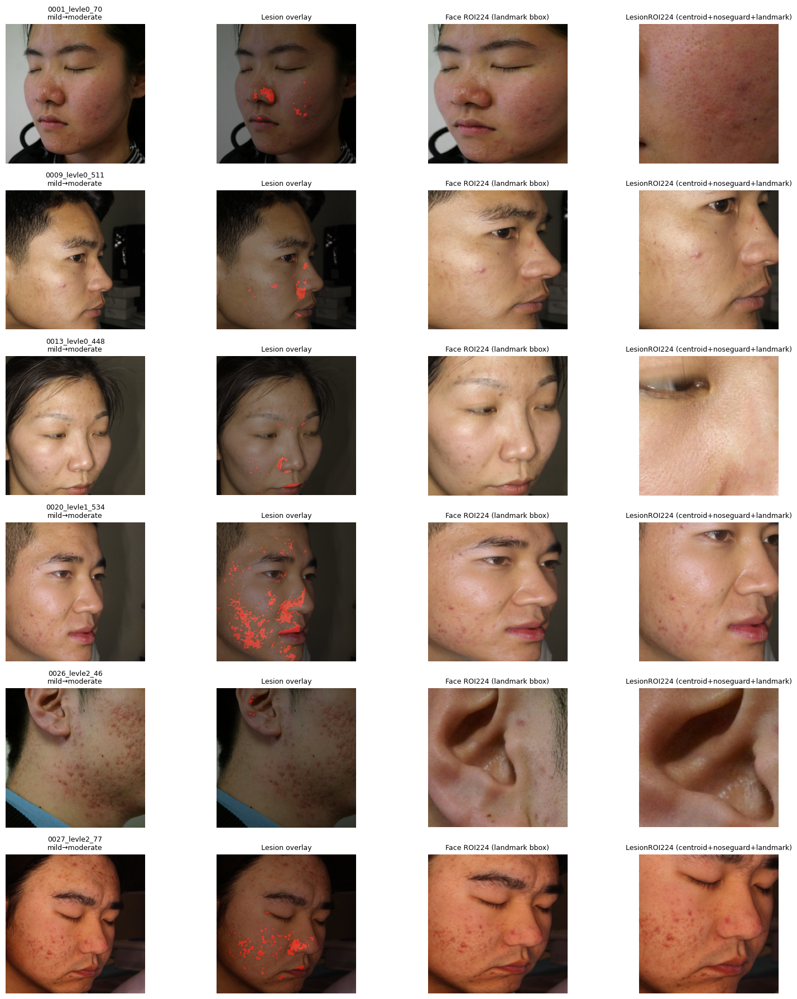

Saved grid: /workspaces/skin-app/data/segmentation/qc_v7_landmarkbbox_grid/v7_grid_mild_to_moderate.png


In [2]:
# ============================================================
# FULL CELL (UPDATED v7): Face ROI vs Lesion ROI
# - Face ROI bbox comes from TRIMMED FaceLandmarker landmarks (percentiles) -> avoids ear/hair crops
# - Lesion ROI is centroid-crop with NOSE-GUARD, clamped to landmark face bbox
#
# Outputs:
#   CSV : /workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v7_landmarkbbox.csv
#   GRID: /workspaces/skin-app/data/segmentation/qc_v7_landmarkbbox_grid/v7_grid_mild_to_moderate.png
# ============================================================

import cv2, numpy as np, pandas as pd
from pathlib import Path
from skimage import measure
import matplotlib.pyplot as plt
import tensorflow as tf
import mediapipe as mp
from mediapipe.tasks import python as mp_python
from mediapipe.tasks.python import vision as mp_vision

# ---------------------------
# CONFIG / PATHS
# ---------------------------
MODEL_PATH = "/workspaces/skin-app/data/artifacts/acne4_stage2_labelsmooth.keras"

IMG_DIR          = Path("/workspaces/skin-app/data/seg_qc_30")
FACE_MASK_DIR    = Path("/workspaces/skin-app/data/segmentation/facial_skin_masks_qc/masks")            # *_skinmask.png
LESION_MASK_DIR  = Path("/workspaces/skin-app/data/segmentation/qc_v3_facemask_constrained/masks")     # *_mask.png

OUT_CSV  = Path("/workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v7_landmarkbbox.csv")
GRID_DIR = Path("/workspaces/skin-app/data/segmentation/qc_v7_landmarkbbox_grid")
GRID_DIR.mkdir(parents=True, exist_ok=True)

CLASSES = ["normal", "mild", "moderate", "severe"]
exts = {".jpg",".jpeg",".png",".bmp",".tif",".tiff"}

# ---------------------------
# Load Model-5
# ---------------------------
model = tf.keras.models.load_model(MODEL_PATH, compile=False)

def predict_probs(bgr_224):
    x = bgr_224.astype(np.float32)[None, ...]  # model has internal rescaling
    return model.predict(x, verbose=0)[0]

# ---------------------------
# MediaPipe FaceLandmarker (Tasks API)
# ---------------------------
MODEL_TASK = Path("/workspaces/skin-app/data/mp_models/face_landmarker.task")
assert MODEL_TASK.exists(), f"Missing FaceLandmarker model: {MODEL_TASK}"

base_options = mp_python.BaseOptions(model_asset_path=str(MODEL_TASK))
options = mp_vision.FaceLandmarkerOptions(
    base_options=base_options,
    output_face_blendshapes=False,
    output_facial_transformation_matrixes=False,
    num_faces=1
)
detector = mp_vision.FaceLandmarker.create_from_options(options)

LEFT_EYE_IDX  = [33,7,163,144,145,153,154,155,133,173,157,158,159,160,161,246]
RIGHT_EYE_IDX = [362,382,381,380,374,373,390,249,263,466,388,387,386,385,384,398]

def get_landmark_pts(bgr):
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    h,w = bgr.shape[:2]
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb)
    res = detector.detect(mp_image)
    if not res.face_landmarks:
        return None
    lms = res.face_landmarks[0]
    pts = np.array([[int(p.x * w), int(p.y * h)] for p in lms], dtype=np.int32)
    return pts

def nose_guard_from_pts(pts, h, w):
    """Ellipse nose-guard + dilation (strong)"""
    if pts is None or len(pts) < 10:
        return np.zeros((h,w), np.uint8)

    le = np.mean([pts[i] for i in LEFT_EYE_IDX if i < len(pts)], axis=0)
    re = np.mean([pts[i] for i in RIGHT_EYE_IDX if i < len(pts)], axis=0)
    d = float(np.linalg.norm(re - le)) + 1e-6
    angle = float(np.degrees(np.arctan2(re[1]-le[1], re[0]-le[0])))

    c = pts[1] if 1 < len(pts) else ((le + re) / 2.0)  # nose tip-ish
    cx, cy = int(c[0]), int(c[1])

    ax = int(0.45 * d)
    ay = int(0.62 * d)

    m = np.zeros((h,w), np.uint8)
    cv2.ellipse(m, (cx,cy), (ax,ay), angle, 0, 360, 255, -1)
    m = cv2.dilate(m, np.ones((21,21), np.uint8), iterations=2)
    return m

def landmark_trimmed_bbox(pts, h, w, x_lo=3, x_hi=97, y_lo=2, y_hi=98):
    """
    Robust face bbox from landmark percentiles (removes ear/hair outliers).
    """
    if pts is None or len(pts) < 50:
        return None
    xs = pts[:,0].astype(np.float32)
    ys = pts[:,1].astype(np.float32)
    x1 = int(np.clip(np.percentile(xs, x_lo), 0, w-1))
    x2 = int(np.clip(np.percentile(xs, x_hi), 0, w-1))
    y1 = int(np.clip(np.percentile(ys, y_lo), 0, h-1))
    y2 = int(np.clip(np.percentile(ys, y_hi), 0, h-1))
    if x2 <= x1 or y2 <= y1:
        return None
    return (x1,y1,x2,y2)

# ---------------------------
# ROI utilities
# ---------------------------
def crop_bbox(bgr, bbox, pad_frac=0.08):
    h,w = bgr.shape[:2]
    x1,y1,x2,y2 = bbox
    bw, bh = (x2-x1+1), (y2-y1+1)
    pad = int(pad_frac * max(bw,bh))
    x1 = max(0, x1-pad); y1 = max(0, y1-pad)
    x2 = min(w-1, x2+pad); y2 = min(h-1, y2+pad)
    crop = bgr[y1:y2+1, x1:x2+1]
    if crop.size == 0:
        return None
    return crop

def roi224_from_bbox(bgr, bbox, pad_frac=0.08):
    crop = crop_bbox(bgr, bbox, pad_frac=pad_frac)
    if crop is None:
        return None
    return cv2.resize(crop, (224,224), interpolation=cv2.INTER_AREA)

def roi224_from_center_crop(bgr):
    h,w = bgr.shape[:2]
    side = min(h,w)
    y1 = (h-side)//2
    x1 = (w-side)//2
    crop = bgr[y1:y1+side, x1:x1+side]
    return cv2.resize(crop, (224,224), interpolation=cv2.INTER_AREA)

def overlay_mask(bgr, mask_u8, alpha=0.40):
    out = bgr.copy()
    red = np.zeros_like(bgr)
    red[mask_u8 > 0] = (0,0,255)
    cv2.addWeighted(red, alpha, out, 1-alpha, 0, out)
    return out

# ---------------------------
# Lesion ROI: centroid crop (nose-guarded), clamped to LANDMARK bbox
# ---------------------------
def lesion_roi224_centroid_noseguard_landmarkbbox(
    bgr, lesion_u8, face_u8, pts, face_bbox, face224,
    min_frac=0.0003, scale=6.0, min_rel=0.40, max_rel=0.85
):
    h,w = bgr.shape[:2]
    if face_bbox is None:
        return face224, "face_fallback_no_landmarkbbox"

    x1f,y1f,x2f,y2f = face_bbox
    face_side = max((x2f-x1f+1),(y2f-y1f+1))

    # constrain lesions to face skin mask if available
    if face_u8 is not None:
        m = ((lesion_u8 > 0) & (face_u8 > 0)).astype(np.uint8) * 255
    else:
        m = (lesion_u8 > 0).astype(np.uint8) * 255

    if float((m > 0).mean()) < min_frac:
        return face224, "face_fallback_tiny_lesions"

    nose_u8 = nose_guard_from_pts(pts, h, w)
    m2 = ((m > 0) & (nose_u8 == 0)).astype(np.uint8) * 255
    use = m2 if m2.sum() > 0 else m
    if use.sum() == 0:
        return face224, "face_fallback_empty_after_guard"

    ys, xs = np.where(use > 0)
    cx = int(xs.mean())
    cy = int(ys.mean())

    area = float(len(xs))
    side = int(np.sqrt(area) * scale)
    side = int(np.clip(side, min_rel * face_side, max_rel * face_side))
    side = max(side, 120)

    # clamp center inside landmark face bbox
    cx = int(np.clip(cx, x1f + side//2, x2f - side//2))
    cy = int(np.clip(cy, y1f + side//2, y2f - side//2))

    # square crop
    x1 = cx - side//2
    y1 = cy - side//2
    x2 = x1 + side - 1
    y2 = y1 + side - 1

    # ensure inside landmark bbox
    if x1 < x1f: x1 = x1f; x2 = x1 + side - 1
    if y1 < y1f: y1 = y1f; y2 = y1 + side - 1
    if x2 > x2f: x2 = x2f; x1 = x2 - side + 1
    if y2 > y2f: y2 = y2f; y1 = y2 - side + 1

    # final clamp to image
    x1 = max(0, x1); y1 = max(0, y1)
    x2 = min(w-1, x2); y2 = min(h-1, y2)

    crop = bgr[y1:y2+1, x1:x2+1]
    if crop.size == 0:
        return face224, "face_fallback_bad_crop"

    roi = cv2.resize(crop, (224,224), interpolation=cv2.INTER_AREA)
    return roi, ("lesion_roi_centroid_noseguard" if m2.sum() > 0 else "lesion_roi_centroid_fallback_m")

# ---------------------------
# MAIN A/B RUN
# ---------------------------
rows = []
used_lesion = 0

for img_path in sorted(IMG_DIR.iterdir()):
    if img_path.suffix.lower() not in exts:
        continue

    bgr = cv2.imread(str(img_path))
    if bgr is None:
        continue
    h,w = bgr.shape[:2]

    # Load masks
    face_path = FACE_MASK_DIR / f"{img_path.stem}_skinmask.png"
    face_u8 = cv2.imread(str(face_path), cv2.IMREAD_GRAYSCALE) if face_path.exists() else None

    lesion_path = LESION_MASK_DIR / f"{img_path.stem}_mask.png"
    lesion_u8 = cv2.imread(str(lesion_path), cv2.IMREAD_GRAYSCALE) if lesion_path.exists() else np.zeros((h,w), np.uint8)

    # Landmarks + landmark bbox (ear-safe)
    pts = get_landmark_pts(bgr)
    face_bbox = landmark_trimmed_bbox(pts, h, w)

    # FACE ROI224 (baseline) uses landmark bbox; fallback to center crop
    face224 = roi224_from_bbox(bgr, face_bbox, pad_frac=0.08) if face_bbox is not None else None
    if face224 is None:
        face224 = roi224_from_center_crop(bgr)

    # LESION ROI224 (updated)
    lesion224, roi_mode = lesion_roi224_centroid_noseguard_landmarkbbox(
        bgr=bgr,
        lesion_u8=lesion_u8,
        face_u8=face_u8,
        pts=pts,
        face_bbox=face_bbox,
        face224=face224
    )
    if roi_mode.startswith("lesion_roi_"):
        used_lesion += 1

    # predictions
    p_face = predict_probs(face224)
    p_les  = predict_probs(lesion224)

    y_face = int(np.argmax(p_face))
    y_les  = int(np.argmax(p_les))

    rows.append({
        "image": str(img_path),
        "roi_mode": roi_mode,
        "pred_face": CLASSES[y_face],
        "conf_face": float(p_face[y_face]),
        "pred_lesionroi_v7": CLASSES[y_les],
        "conf_lesionroi_v7": float(p_les[y_les]),
        "changed": int(y_face != y_les),
    })

df = pd.DataFrame(rows)
df.to_csv(OUT_CSV, index=False)

print("Wrote:", OUT_CSV)
print("Used lesion ROI:", used_lesion, "/", len(df))
print("Changed predictions:", int(df["changed"].sum()), "/", len(df))
print("\nTransition counts (face -> lesionROI v7):")
print(pd.crosstab(df["pred_face"], df["pred_lesionroi_v7"]))

# ---------------------------
# QC GRID: first 12 mild->moderate changes
# ---------------------------
chg = df[(df["pred_face"]=="mild") & (df["pred_lesionroi_v7"]=="moderate")].head(12)

plt.figure(figsize=(16, 3*max(1,len(chg))))
for i, row in enumerate(chg.itertuples(index=False), 1):
    img_path = Path(row.image)
    bgr = cv2.imread(str(img_path))
    h,w = bgr.shape[:2]

    face_u8 = cv2.imread(str(FACE_MASK_DIR / f"{img_path.stem}_skinmask.png"), cv2.IMREAD_GRAYSCALE)
    lesion_u8 = cv2.imread(str(LESION_MASK_DIR / f"{img_path.stem}_mask.png"), cv2.IMREAD_GRAYSCALE)
    ovl = overlay_mask(bgr, lesion_u8)

    pts = get_landmark_pts(bgr)
    face_bbox = landmark_trimmed_bbox(pts, h, w)
    face224 = roi224_from_bbox(bgr, face_bbox, pad_frac=0.08) if face_bbox is not None else roi224_from_center_crop(bgr)

    lesion224, _ = lesion_roi224_centroid_noseguard_landmarkbbox(
        bgr=bgr, lesion_u8=lesion_u8, face_u8=face_u8, pts=pts, face_bbox=face_bbox, face224=face224
    )

    plt.subplot(len(chg), 4, (i-1)*4 + 1)
    plt.imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)); plt.axis("off")
    plt.title(f"{img_path.stem}\n{row.pred_face}→{row.pred_lesionroi_v7}", fontsize=9)

    plt.subplot(len(chg), 4, (i-1)*4 + 2)
    plt.imshow(cv2.cvtColor(ovl, cv2.COLOR_BGR2RGB)); plt.axis("off")
    plt.title("Lesion overlay", fontsize=9)

    plt.subplot(len(chg), 4, (i-1)*4 + 3)
    plt.imshow(cv2.cvtColor(face224, cv2.COLOR_BGR2RGB)); plt.axis("off")
    plt.title("Face ROI224 (landmark bbox)", fontsize=9)

    plt.subplot(len(chg), 4, (i-1)*4 + 4)
    plt.imshow(cv2.cvtColor(lesion224, cv2.COLOR_BGR2RGB)); plt.axis("off")
    plt.title("LesionROI224 (centroid+noseguard+landmark)", fontsize=9)

plt.tight_layout()
grid_path = GRID_DIR / "v7_grid_mild_to_moderate.png"
plt.savefig(grid_path, dpi=150)
plt.show()
print("Saved grid:", grid_path)


Changed cases: 7
Fallback cases: 5

Changed summary:
                                                   image                      roi_mode pred_face pred_lesionroi_v7  conf_face  conf_lesionroi_v7
 /workspaces/skin-app/data/seg_qc_30/0001_levle0_70.jpg lesion_roi_centroid_noseguard      mild          moderate   0.295951           0.294742
/workspaces/skin-app/data/seg_qc_30/0009_levle0_511.jpg lesion_roi_centroid_noseguard      mild          moderate   0.301607           0.295748
/workspaces/skin-app/data/seg_qc_30/0013_levle0_448.jpg lesion_roi_centroid_noseguard      mild          moderate   0.297288           0.295972
/workspaces/skin-app/data/seg_qc_30/0020_levle1_534.jpg lesion_roi_centroid_noseguard      mild          moderate   0.302575           0.296052
 /workspaces/skin-app/data/seg_qc_30/0026_levle2_46.jpg lesion_roi_centroid_noseguard      mild          moderate   0.305084           0.294554
 /workspaces/skin-app/data/seg_qc_30/0027_levle2_77.jpg lesion_roi_centroid_nosegu

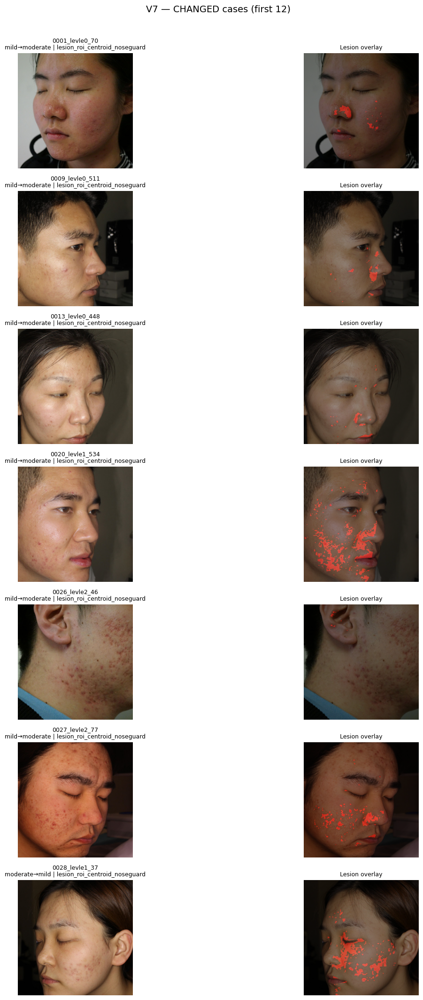

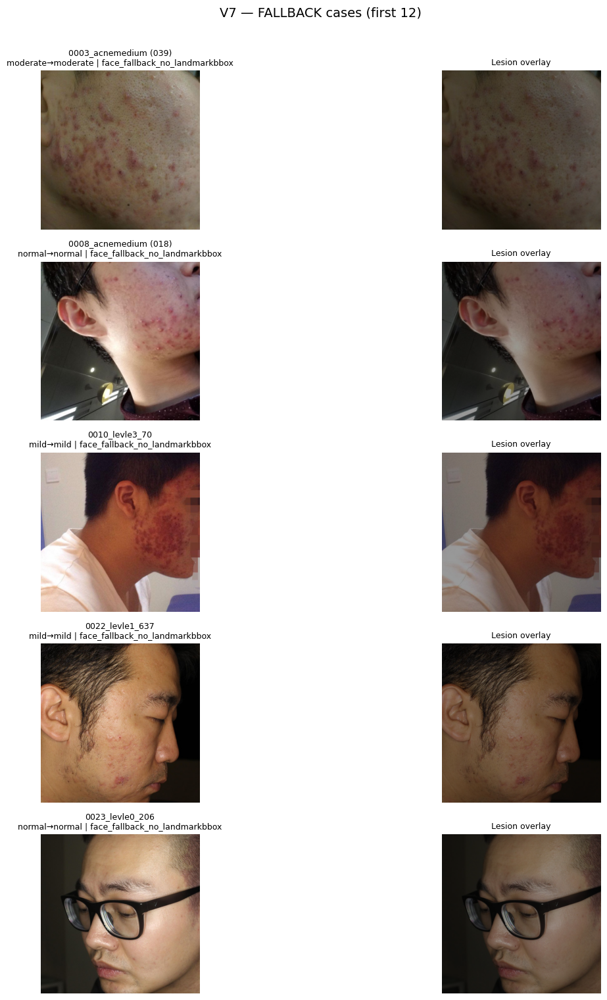

In [3]:
import cv2, numpy as np, pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt

CSV_PATH = Path("/workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v7_landmarkbbox.csv")
IMG_DIR  = Path("/workspaces/skin-app/data/seg_qc_30")
LESION_MASK_DIR  = Path("/workspaces/skin-app/data/segmentation/qc_v3_facemask_constrained/masks")

df = pd.read_csv(CSV_PATH)

changed = df[df["changed"] == 1].copy()
fallback = df[df["roi_mode"].str.startswith("face_fallback", na=False)].copy()

print("Changed cases:", len(changed))
print("Fallback cases:", len(fallback))
display_cols = ["image","roi_mode","pred_face","pred_lesionroi_v7","conf_face","conf_lesionroi_v7"]
print("\nChanged summary:\n", changed[display_cols].head(20).to_string(index=False))

def overlay_mask(bgr, mask_u8, alpha=0.40):
    out = bgr.copy()
    red = np.zeros_like(bgr)
    red[mask_u8 > 0] = (0,0,255)
    cv2.addWeighted(red, alpha, out, 1-alpha, 0, out)
    return out

def read_bgr(p): 
    bgr = cv2.imread(str(p))
    if bgr is None:
        raise FileNotFoundError(p)
    return bgr

def read_mask(mask_path, shape_hw):
    if mask_path.exists():
        m = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
        if m is None:
            m = np.zeros(shape_hw, np.uint8)
        return m
    return np.zeros(shape_hw, np.uint8)

def make_grid(subdf, title, max_rows=12):
    subdf = subdf.head(max_rows)
    n = len(subdf)
    if n == 0:
        print(f"No rows for {title}")
        return

    plt.figure(figsize=(16, 3*n))
    for i, row in enumerate(subdf.itertuples(index=False), 1):
        img_path = Path(row.image)
        bgr = read_bgr(img_path)
        h,w = bgr.shape[:2]

        mask_path = LESION_MASK_DIR / f"{img_path.stem}_mask.png"
        lesion = read_mask(mask_path, (h,w))

        ovl = overlay_mask(bgr, lesion, alpha=0.40)

        # NOTE: v7 already saved the actual ROIs in your earlier grid,
        # but here we just show original+overlay (key for checking segmentation correctness).
        # If you want, we can extend this to re-render face224/lesion224 too.

        plt.subplot(n, 2, (i-1)*2 + 1)
        plt.imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.title(f"{img_path.stem}\n{row.pred_face}→{row.pred_lesionroi_v7} | {row.roi_mode}", fontsize=9)

        plt.subplot(n, 2, (i-1)*2 + 2)
        plt.imshow(cv2.cvtColor(ovl, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.title("Lesion overlay", fontsize=9)

    plt.suptitle(title, y=1.01, fontsize=14)
    plt.tight_layout()
    plt.show()

make_grid(changed, "V7 — CHANGED cases (first 12)")
make_grid(fallback, "V7 — FALLBACK cases (first 12)")


In [4]:
import cv2, numpy as np, pandas as pd
from pathlib import Path
import mediapipe as mp
from mediapipe.tasks import python as mp_python
from mediapipe.tasks.python import vision as mp_vision

# --- Paths ---
IMG_DIR = Path("/workspaces/skin-app/data/seg_qc_30")
LESION_MASK_DIR  = Path("/workspaces/skin-app/data/segmentation/qc_v3_facemask_constrained/masks")

# --- MediaPipe FaceLandmarker (Tasks API) ---
MODEL_TASK = Path("/workspaces/skin-app/data/mp_models/face_landmarker.task")
base_options = mp_python.BaseOptions(model_asset_path=str(MODEL_TASK))
options = mp_vision.FaceLandmarkerOptions(
    base_options=base_options,
    output_face_blendshapes=False,
    output_facial_transformation_matrixes=False,
    num_faces=1
)
detector = mp_vision.FaceLandmarker.create_from_options(options)

LEFT_EYE_IDX  = [33,7,163,144,145,153,154,155,133,173,157,158,159,160,161,246]
RIGHT_EYE_IDX = [362,382,381,380,374,373,390,249,263,466,388,387,386,385,384,398]

def get_landmark_pts(bgr):
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    h,w = bgr.shape[:2]
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb)
    res = detector.detect(mp_image)
    if not res.face_landmarks:
        return None
    lms = res.face_landmarks[0]
    pts = np.array([[int(p.x * w), int(p.y * h)] for p in lms], dtype=np.int32)
    return pts

def nose_guard_from_pts(pts, h, w):
    if pts is None or len(pts) < 10:
        return np.zeros((h,w), np.uint8)

    le = np.mean([pts[i] for i in LEFT_EYE_IDX if i < len(pts)], axis=0)
    re = np.mean([pts[i] for i in RIGHT_EYE_IDX if i < len(pts)], axis=0)
    d = float(np.linalg.norm(re - le)) + 1e-6
    angle = float(np.degrees(np.arctan2(re[1]-le[1], re[0]-le[0])))

    c = pts[1] if 1 < len(pts) else ((le + re) / 2.0)  # nose tip-ish
    cx, cy = int(c[0]), int(c[1])

    ax = int(0.45 * d)
    ay = int(0.62 * d)

    m = np.zeros((h,w), np.uint8)
    cv2.ellipse(m, (cx,cy), (ax,ay), angle, 0, 360, 255, -1)
    m = cv2.dilate(m, np.ones((21,21), np.uint8), iterations=2)
    return m

rows = []
exts = {".jpg",".jpeg",".png",".bmp",".tif",".tiff"}

for img_path in sorted(IMG_DIR.iterdir()):
    if img_path.suffix.lower() not in exts:
        continue

    bgr = cv2.imread(str(img_path))
    if bgr is None:
        continue
    h,w = bgr.shape[:2]

    mask_path = LESION_MASK_DIR / f"{img_path.stem}_mask.png"
    lesion = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE) if mask_path.exists() else None
    if lesion is None:
        continue

    lesion_bin = (lesion > 0)
    lesion_count = int(lesion_bin.sum())
    if lesion_count == 0:
        rows.append({"image": img_path.name, "lesion_px": 0, "nose_overlap": 0.0, "landmarks": False})
        continue

    pts = get_landmark_pts(bgr)
    nose = nose_guard_from_pts(pts, h, w)
    nose_bin = (nose > 0)

    inside = int((lesion_bin & nose_bin).sum())
    overlap = inside / (lesion_count + 1e-9)

    rows.append({
        "image": img_path.name,
        "lesion_px": lesion_count,
        "nose_inside_px": inside,
        "nose_overlap": float(overlap),
        "landmarks": pts is not None
    })

df = pd.DataFrame(rows).sort_values("nose_overlap", ascending=False)

print("Total images:", len(df))
print("Landmark success:", int(df["landmarks"].sum()), "/", len(df))
print("Count nose_overlap >= 0.30:", int((df["nose_overlap"] >= 0.30).sum()))
print("Count nose_overlap >= 0.50:", int((df["nose_overlap"] >= 0.50).sum()))

print("\nTop-10 nose-dominant cases:")
display(df.head(10))


W0000 00:00:1767104880.325649   11382 face_landmarker_graph.cc:174] Sets FaceBlendshapesGraph acceleration to xnnpack by default.
W0000 00:00:1767104880.331844   11383 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1767104880.345015   11383 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Total images: 30
Landmark success: 25 / 30
Count nose_overlap >= 0.30: 7
Count nose_overlap >= 0.50: 3

Top-10 nose-dominant cases:


,image,lesion_px,nose_inside_px,nose_overlap,landmarks
13,0013_levle0_448.jpg,7002,5300.0,0.756927,True
1,0001_levle0_70.jpg,10345,7450.0,0.720155,True
14,0014_levle1_593.jpg,29650,16254.0,0.548196,True
7,0007_levle1_182.jpg,18941,9386.0,0.495539,True
16,0016_levle0_228.jpg,50056,24351.0,0.486475,True
19,0019_levle1_482.jpg,29775,13735.0,0.461293,True
2,0002_levle0_198.jpg,62359,22474.0,0.360397,True
24,0024_levle1_484.jpg,19396,5494.0,0.283254,True
27,0027_levle2_77.jpg,23553,6028.0,0.255933,True
17,0017_levle0_22.jpg,12885,3131.0,0.242996,True


In [6]:
# ============================================================
# V8: Face ROI vs Lesion ROI with NOSE-DOMINANCE GATE
# - If lesion mask is nose-dominant (>=0.50), subtract nose region and re-centroid.
# - If remaining lesion pixels are too few, fallback to Face ROI.
# Output: qc_ab_severity_face_vs_lesionroi_v8_nosegate.csv
# ============================================================

import os
import cv2
import numpy as np
import pandas as pd
from pathlib import Path
import tensorflow as tf
import mediapipe as mp
from mediapipe.tasks import python as mp_python
from mediapipe.tasks.python import vision as mp_vision

# ---------------------------
# Paths (edit if needed)
# ---------------------------
MODEL_PATH = Path("/workspaces/skin-app/data/artifacts/acne4_stage2_labelsmooth.keras")
IMG_DIR    = Path("/workspaces/skin-app/data/seg_qc_30")
LESION_MASK_DIR = Path("/workspaces/skin-app/data/segmentation/qc_v3_facemask_constrained/masks")
OUT_CSV = Path("/workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v8_nosegate.csv")

# ---------------------------
# Load model
# ---------------------------
model = tf.keras.models.load_model(str(MODEL_PATH), compile=False)
CLASS_NAMES = ["normal", "mild", "moderate", "severe"]

def predict_probs(bgr_224):
    # model trained on RGB; cv2 loads BGR
    rgb = cv2.cvtColor(bgr_224, cv2.COLOR_BGR2RGB)
    x = rgb.astype(np.float32)[None, ...]  # assume model has internal rescaling
    p = model.predict(x, verbose=0)[0]
    return p

# ---------------------------
# MediaPipe FaceLandmarker (Tasks API)
# ---------------------------
MODEL_TASK = Path("/workspaces/skin-app/data/mp_models/face_landmarker.task")
base_options = mp_python.BaseOptions(model_asset_path=str(MODEL_TASK))
options = mp_vision.FaceLandmarkerOptions(
    base_options=base_options,
    output_face_blendshapes=False,
    output_facial_transformation_matrixes=False,
    num_faces=1
)
detector = mp_vision.FaceLandmarker.create_from_options(options)

# Eye indices (approx) for inter-ocular distance
LEFT_EYE_IDX  = [33,7,163,144,145,153,154,155,133,173,157,158,159,160,161,246]
RIGHT_EYE_IDX = [362,382,381,380,374,373,390,249,263,466,388,387,386,385,384,398]

def get_landmark_pts(bgr):
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    h,w = bgr.shape[:2]
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb)
    res = detector.detect(mp_image)
    if not res.face_landmarks:
        return None
    lms = res.face_landmarks[0]
    pts = np.array([[int(p.x * w), int(p.y * h)] for p in lms], dtype=np.int32)
    return pts

def safe_bbox_from_pts(pts, h, w, pad=0.10):
    x0,y0 = pts[:,0].min(), pts[:,1].min()
    x1,y1 = pts[:,0].max(), pts[:,1].max()
    bw, bh = (x1-x0), (y1-y0)
    x0 = int(max(0, x0 - pad*bw)); y0 = int(max(0, y0 - pad*bh))
    x1 = int(min(w-1, x1 + pad*bw)); y1 = int(min(h-1, y1 + pad*bh))
    return x0,y0,x1,y1

def interocular_and_angle(pts):
    le = np.mean([pts[i] for i in LEFT_EYE_IDX if i < len(pts)], axis=0)
    re = np.mean([pts[i] for i in RIGHT_EYE_IDX if i < len(pts)], axis=0)
    d = float(np.linalg.norm(re - le)) + 1e-6
    angle = float(np.degrees(np.arctan2(re[1]-le[1], re[0]-le[0])))
    return d, angle, le, re

def nose_guard_from_pts(pts, h, w):
    # Elliptical “nose guard” around nose tip-ish landmark 1, scaled by inter-ocular distance
    m = np.zeros((h,w), np.uint8)
    if pts is None:
        return m
    d, angle, le, re = interocular_and_angle(pts)
    c = pts[1] if 1 < len(pts) else ((le + re) / 2.0)
    cx, cy = int(c[0]), int(c[1])

    ax = int(0.45 * d)
    ay = int(0.62 * d)

    cv2.ellipse(m, (cx,cy), (ax,ay), angle, 0, 360, 255, -1)
    m = cv2.dilate(m, np.ones((21,21), np.uint8), iterations=2)
    return m

def crop_square(bgr, x0,y0,x1,y1, out=224):
    crop = bgr[y0:y1, x0:x1].copy()
    if crop.size == 0:
        return None
    return cv2.resize(crop, (out,out), interpolation=cv2.INTER_AREA)

def crop_square_center(bgr, cx, cy, side, out=224):
    h,w = bgr.shape[:2]
    half = side // 2
    x0, x1 = int(cx - half), int(cx + half)
    y0, y1 = int(cy - half), int(cy + half)
    # pad if needed
    pad_l = max(0, -x0); pad_t = max(0, -y0)
    pad_r = max(0, x1 - w); pad_b = max(0, y1 - h)
    x0 = max(0, x0); y0 = max(0, y0)
    x1 = min(w, x1); y1 = min(h, y1)
    crop = bgr[y0:y1, x0:x1].copy()
    if crop.size == 0:
        return None
    if any([pad_l,pad_t,pad_r,pad_b]):
        crop = cv2.copyMakeBorder(crop, pad_t, pad_b, pad_l, pad_r, borderType=cv2.BORDER_REFLECT)
    return cv2.resize(crop, (out,out), interpolation=cv2.INTER_AREA)

def centroid_from_mask(mask_u8):
    ys, xs = np.where(mask_u8 > 0)
    if len(xs) == 0:
        return None
    return int(xs.mean()), int(ys.mean())

# ---------------------------
# Parameters (you can tune later; keep fixed for this test)
# ---------------------------
NOSE_OVERLAP_THR = 0.50
MIN_REMAIN_PX = 400   # if (mask minus nose) has < this, fallback to face ROI

rows = []
exts = {".jpg",".jpeg",".png",".bmp",".tif",".tiff"}

for img_path in sorted(IMG_DIR.iterdir()):
    if img_path.suffix.lower() not in exts:
        continue

    bgr = cv2.imread(str(img_path))
    if bgr is None:
        continue
    h,w = bgr.shape[:2]

    # --- Face bbox/ROI (landmarks if possible) ---
    pts = get_landmark_pts(bgr)
    if pts is not None:
        fx0,fy0,fx1,fy1 = safe_bbox_from_pts(pts, h, w, pad=0.10)
        face224 = crop_square(bgr, fx0,fy0,fx1,fy1, out=224)
        face_mode = "face_landmarkbbox"
    else:
        # fallback: center square crop
        side = min(h,w)
        face224 = crop_square_center(bgr, w//2, h//2, side, out=224)
        face_mode = "face_fallback_center"

    p_face = predict_probs(face224)
    y_face = int(np.argmax(p_face))
    pred_face = CLASS_NAMES[y_face]
    conf_face = float(np.max(p_face))

    # --- Lesion mask ---
    mask_path = LESION_MASK_DIR / f"{img_path.stem}_mask.png"
    lesion = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE) if mask_path.exists() else None
    if lesion is None:
        # no lesion mask -> no lesion ROI
        rows.append({
            "image": str(img_path),
            "roi_mode": "no_mask_face_only",
            "pred_face": pred_face, "conf_face": conf_face,
            "pred_lesionroi_v8": pred_face, "conf_lesionroi_v8": conf_face,
            "nose_overlap": np.nan,
            "changed": 0
        })
        continue

    lesion_bin = (lesion > 0).astype(np.uint8)*255
    lesion_px = int((lesion_bin > 0).sum())
    if lesion_px == 0:
        rows.append({
            "image": str(img_path),
            "roi_mode": "empty_mask_face_only",
            "pred_face": pred_face, "conf_face": conf_face,
            "pred_lesionroi_v8": pred_face, "conf_lesionroi_v8": conf_face,
            "nose_overlap": 0.0,
            "changed": 0
        })
        continue

    # --- Nose overlap and gate ---
    nose = nose_guard_from_pts(pts, h, w)
    nose_bin = (nose > 0)
    inside = int(((lesion_bin > 0) & nose_bin).sum())
    nose_overlap = inside / (lesion_px + 1e-9)

    lesion_eff = lesion_bin.copy()
    roi_mode = "lesion_roi_v8"

    if nose_overlap >= NOSE_OVERLAP_THR:
        # remove nose region and re-check if anything remains
        lesion_wo_nose = lesion_eff.copy()
        lesion_wo_nose[nose_bin] = 0
        remain_px = int((lesion_wo_nose > 0).sum())

        if remain_px >= MIN_REMAIN_PX:
            lesion_eff = lesion_wo_nose
            roi_mode = "lesion_roi_v8_nose_suppressed"
        else:
            # fallback to face
            p_les = p_face
            y_les = y_face
            pred_les = pred_face
            conf_les = conf_face
            rows.append({
                "image": str(img_path),
                "roi_mode": "face_fallback_nose_dominant",
                "pred_face": pred_face, "conf_face": conf_face,
                "pred_lesionroi_v8": pred_les, "conf_lesionroi_v8": conf_les,
                "nose_overlap": float(nose_overlap),
                "changed": 0
            })
            continue

    # --- Lesion ROI crop (centroid within face bbox if available) ---
    c = centroid_from_mask(lesion_eff)
    if c is None:
        # fallback to face
        p_les = p_face
        y_les = y_face
        pred_les = pred_face
        conf_les = conf_face
        roi_mode = "face_fallback_no_centroid"
    else:
        cx, cy = c

        # clamp centroid into face bbox if landmarks exist
        if pts is not None:
            fx0,fy0,fx1,fy1 = safe_bbox_from_pts(pts, h, w, pad=0.10)
            cx = int(np.clip(cx, fx0, fx1))
            cy = int(np.clip(cy, fy0, fy1))

            # dynamic side based on face bbox (bounded)
            face_side = max(fx1-fx0, fy1-fy0)
            side = int(np.clip(0.55*face_side, 240, 520))
        else:
            side = int(np.clip(0.55*min(h,w), 240, 520))

        lesion224 = crop_square_center(bgr, cx, cy, side, out=224)
        if lesion224 is None:
            p_les = p_face
            y_les = y_face
            pred_les = pred_face
            conf_les = conf_face
            roi_mode = "face_fallback_bad_crop"
        else:
            p_les = predict_probs(lesion224)
            y_les = int(np.argmax(p_les))
            pred_les = CLASS_NAMES[y_les]
            conf_les = float(np.max(p_les))

    changed = int(pred_face != pred_les)

    rows.append({
        "image": str(img_path),
        "roi_mode": roi_mode,
        "pred_face": pred_face, "conf_face": conf_face,
        "pred_lesionroi_v8": pred_les, "conf_lesionroi_v8": conf_les,
        "nose_overlap": float(nose_overlap),
        "changed": changed
    })


df = pd.DataFrame(rows)
df.to_csv(OUT_CSV, index=False)

print("Wrote:", OUT_CSV)

used_mask = (~df["roi_mode"].str.startswith("face_fallback")) & (~df["roi_mode"].str.contains("face_only"))
print("Used lesion ROI:", int(used_mask.sum()), "/", len(df))

print("Changed predictions:", int(df["changed"].sum()), "/", len(df))

ct = pd.crosstab(df["pred_face"], df["pred_lesionroi_v8"])
print("\nTransition counts (face -> lesionROI v8):")
print(ct)

nose_dom = df[df["nose_overlap"] >= 0.50]
print("\nNose-dominant (>=0.50) cases:", len(nose_dom))
if len(nose_dom) > 0:
    print(nose_dom[["image","nose_overlap","roi_mode","pred_face","pred_lesionroi_v8"]]
          .sort_values("nose_overlap", ascending=False)
          .to_string(index=False))


W0000 00:00:1767105333.870846   14028 face_landmarker_graph.cc:174] Sets FaceBlendshapesGraph acceleration to xnnpack by default.
W0000 00:00:1767105333.876828   14030 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1767105333.890205   14040 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Wrote: /workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v8_nosegate.csv
Used lesion ROI: 25 / 30
Changed predictions: 20 / 30

Transition counts (face -> lesionROI v8):
pred_lesionroi_v8  mild  moderate  normal
pred_face                                
mild                  6        20       0
moderate              0         2       0
normal                0         0       2

Nose-dominant (>=0.50) cases: 3
                                                  image  nose_overlap                      roi_mode pred_face pred_lesionroi_v8
/workspaces/skin-app/data/seg_qc_30/0013_levle0_448.jpg      0.756927 lesion_roi_v8_nose_suppressed      mild          moderate
 /workspaces/skin-app/data/seg_qc_30/0001_levle0_70.jpg      0.720155 lesion_roi_v8_nose_suppressed      mild          moderate
/workspaces/skin-app/data/seg_qc_30/0014_levle1_593.jpg      0.548196 lesion_roi_v8_nose_suppressed      mild              mild


In [7]:
import re
import pandas as pd
from pathlib import Path

V8_CSV = Path("/workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v8_nosegate.csv")

df = pd.read_csv(V8_CSV)

# ----------------------------
# 1) SET THIS MAPPING (edit after you reply)
# Example A:
# level0=mild, level1=moderate, level2=severe, level3=severe
# Example B:
# level0=normal, level1=mild, level2=moderate, level3=severe
# ----------------------------
level_to_gt = {
    0: "mild",
    1: "moderate",
    2: "severe",
    3: "severe",
}

def gt_from_filename(path_str):
    name = Path(path_str).name.lower()
    m = re.search(r"level(\d)", name)
    if m:
        return level_to_gt.get(int(m.group(1)), None)
    # optional: if you have explicit normal naming
    if "normal" in name:
        return "normal"
    return None

df["gt"] = df["image"].apply(gt_from_filename)
df_eval = df[df["gt"].notna()].copy()

print("Eval rows with GT from filename:", len(df_eval), "/", len(df))
print(df_eval["gt"].value_counts())

# Confusions
face_ct = pd.crosstab(df_eval["gt"], df_eval["pred_face"])
v8_ct   = pd.crosstab(df_eval["gt"], df_eval["pred_lesionroi_v8"])

print("\nConfusion (GT -> pred_face):")
print(face_ct)

print("\nConfusion (GT -> pred_lesionroi_v8):")
print(v8_ct)

def recall_for_class(ct, cls):
    # recall = TP / (all GT cls)
    if cls not in ct.index:
        return None
    denom = ct.loc[cls].sum()
    if denom == 0:
        return None
    tp = ct.loc[cls, cls] if cls in ct.columns else 0
    return float(tp / denom)

for cls in ["normal","mild","moderate","severe"]:
    r_face = recall_for_class(face_ct, cls)
    r_v8   = recall_for_class(v8_ct, cls)
    if r_face is not None or r_v8 is not None:
        print(f"\nRecall {cls}: face={r_face} | v8={r_v8}")


Eval rows with GT from filename: 0 / 30
Series([], Name: count, dtype: int64)

Confusion (GT -> pred_face):
Empty DataFrame
Columns: []
Index: []

Confusion (GT -> pred_lesionroi_v8):
Empty DataFrame
Columns: []
Index: []


In [9]:
import re
from pathlib import Path

IMG_DIR = Path("/workspaces/skin-app/data/seg_qc_30")
names = sorted([p.name for p in IMG_DIR.iterdir() if p.suffix.lower() in {".jpg",".jpeg",".png"}])

def extract_tag(name: str):
    s = name.lower()
    m = re.search(r"(?:level|levle)(\d)", s)   # handles both "level" and your "levle"
    if m:
        return f"level{m.group(1)}"
    if "acnemedium" in s:
        return "acnemedium"
    if "acne" in s:
        return "acne_other"
    if "normal" in s:
        return "normal"
    return None

tags = [extract_tag(n) for n in names]

print("Sample filenames:", names[:10])
print("Extracted tags (first 10):", tags[:10])
print("Unique tags:", sorted(set([t for t in tags if t is not None])))
print("Missing tag count:", sum(t is None for t in tags), "/", len(tags))


Sample filenames: ['0000_levle2_37.jpg', '0001_levle0_70.jpg', '0002_levle0_198.jpg', '0003_acnemedium (039).jpg', '0004_levle2_121.jpg', '0005_levle1_580.jpg', '0006_levle1_50.jpg', '0007_levle1_182.jpg', '0008_acnemedium (018).jpg', '0009_levle0_511.jpg']
Extracted tags (first 10): ['level2', 'level0', 'level0', 'acnemedium', 'level2', 'level1', 'level1', 'level1', 'acnemedium', 'level0']
Unique tags: ['acnemedium', 'level0', 'level1', 'level2', 'level3']
Missing tag count: 0 / 30


In [10]:
import re
import pandas as pd
from pathlib import Path

V8_CSV = Path("/workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v8_nosegate.csv")

df = pd.read_csv(V8_CSV)

tag_to_gt = {
    "level0": "mild",
    "level1": "moderate",
    "level2": "severe",
    "level3": "severe",
    "acnemedium": "moderate",
}

def tag_from_filename(path_str):
    name = Path(path_str).name.lower()
    m = re.search(r"(?:level|levle)(\d)", name)
    if m:
        return f"level{m.group(1)}"
    if "acnemedium" in name:
        return "acnemedium"
    return None

df["tag"] = df["image"].apply(tag_from_filename)
df["gt"]  = df["tag"].map(tag_to_gt)

df_eval = df[df["gt"].notna()].copy()
print("Eval rows:", len(df_eval), "/", len(df))
print("\nGT counts:\n", df_eval["gt"].value_counts().to_string())

face_ct = pd.crosstab(df_eval["gt"], df_eval["pred_face"])
v8_ct   = pd.crosstab(df_eval["gt"], df_eval["pred_lesionroi_v8"])

print("\nConfusion (GT -> pred_face):")
print(face_ct)

print("\nConfusion (GT -> pred_lesionroi_v8):")
print(v8_ct)

def recall(ct, cls):
    if cls not in ct.index:
        return None
    denom = ct.loc[cls].sum()
    if denom == 0:
        return None
    tp = ct.loc[cls, cls] if cls in ct.columns else 0
    return float(tp / denom)

for cls in ["mild","moderate","severe","normal"]:
    r_face = recall(face_ct, cls)
    r_v8   = recall(v8_ct, cls)
    print(f"\nRecall {cls}: face={r_face} | v8={r_v8}")


Eval rows: 30 / 30

GT counts:
 gt
moderate    16
mild         9
severe       5

Confusion (GT -> pred_face):
pred_face  mild  moderate  normal
gt                               
mild          8         0       1
moderate     13         2       1
severe        5         0       0

Confusion (GT -> pred_lesionroi_v8):
pred_lesionroi_v8  mild  moderate  normal
gt                                       
mild                  0         8       1
moderate              5        10       1
severe                1         4       0

Recall mild: face=0.8888888888888888 | v8=0.0

Recall moderate: face=0.125 | v8=0.625

Recall severe: face=0.0 | v8=0.0

Recall normal: face=None | v8=None


In [11]:
import re
import pandas as pd
from pathlib import Path

V7_CSV = Path("/workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v7_landmarkbbox.csv")

df = pd.read_csv(V7_CSV)

tag_to_gt = {
    "level0": "mild",
    "level1": "moderate",
    "level2": "severe",
    "level3": "severe",
    "acnemedium": "moderate",
}

def tag_from_filename(path_str):
    name = Path(path_str).name.lower()
    m = re.search(r"(?:level|levle)(\d)", name)
    if m:
        return f"level{m.group(1)}"
    if "acnemedium" in name:
        return "acnemedium"
    return None

df["tag"] = df["image"].apply(tag_from_filename)
df["gt"]  = df["tag"].map(tag_to_gt)

df_eval = df[df["gt"].notna()].copy()
print("Eval rows:", len(df_eval), "/", len(df))
print("\nGT counts:\n", df_eval["gt"].value_counts().to_string())

face_ct = pd.crosstab(df_eval["gt"], df_eval["pred_face"])
v7_ct   = pd.crosstab(df_eval["gt"], df_eval["pred_lesionroi_v7"])

print("\nConfusion (GT -> pred_face):")
print(face_ct)

print("\nConfusion (GT -> pred_lesionroi_v7):")
print(v7_ct)

def recall(ct, cls):
    if cls not in ct.index:
        return None
    denom = ct.loc[cls].sum()
    if denom == 0:
        return None
    tp = ct.loc[cls, cls] if cls in ct.columns else 0
    return float(tp / denom)

for cls in ["mild","moderate","severe"]:
    print(f"\nRecall {cls}: face={recall(face_ct, cls)} | v7={recall(v7_ct, cls)}")


Eval rows: 30 / 30

GT counts:
 gt
moderate    16
mild         9
severe       5

Confusion (GT -> pred_face):
pred_face  mild  moderate  normal
gt                               
mild          8         0       1
moderate     11         4       1
severe        5         0       0

Confusion (GT -> pred_lesionroi_v7):
pred_lesionroi_v7  mild  moderate  normal
gt                                       
mild                  5         3       1
moderate             11         4       1
severe                3         2       0

Recall mild: face=0.8888888888888888 | v7=0.5555555555555556

Recall moderate: face=0.25 | v7=0.25

Recall severe: face=0.0 | v7=0.0


In [12]:
import re, cv2, numpy as np, pandas as pd
from pathlib import Path
import mediapipe as mp
from mediapipe.tasks import python as mp_python
from mediapipe.tasks.python import vision as mp_vision

CSV_V7 = Path("/workspaces/skin-app/data/segmentation/qc_ab_severity_face_vs_lesionroi_v7_landmarkbbox.csv")
IMG_DIR = Path("/workspaces/skin-app/data/seg_qc_30")
LESION_MASK_DIR  = Path("/workspaces/skin-app/data/segmentation/qc_v3_facemask_constrained/masks")

df = pd.read_csv(CSV_V7)

# GT mapping from your tags
tag_to_gt = {"level0":"mild","level1":"moderate","level2":"severe","level3":"severe","acnemedium":"moderate"}

def tag_from_filename(path_str):
    name = Path(path_str).name.lower()
    m = re.search(r"(?:level|levle)(\d)", name)
    if m: return f"level{m.group(1)}"
    if "acnemedium" in name: return "acnemedium"
    return None

df["tag"] = df["image"].apply(tag_from_filename)
df["gt"]  = df["tag"].map(tag_to_gt)

# MediaPipe landmarker for nose_overlap (same as your earlier)
MODEL_TASK = Path("/workspaces/skin-app/data/mp_models/face_landmarker.task")
base_options = mp_python.BaseOptions(model_asset_path=str(MODEL_TASK))
options = mp_vision.FaceLandmarkerOptions(
    base_options=base_options,
    output_face_blendshapes=False,
    output_facial_transformation_matrixes=False,
    num_faces=1
)
detector = mp_vision.FaceLandmarker.create_from_options(options)

LEFT_EYE_IDX  = [33,7,163,144,145,153,154,155,133,173,157,158,159,160,161,246]
RIGHT_EYE_IDX = [362,382,381,380,374,373,390,249,263,466,388,387,386,385,384,398]

def get_landmark_pts(bgr):
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    h,w = bgr.shape[:2]
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb)
    res = detector.detect(mp_image)
    if not res.face_landmarks:
        return None
    lms = res.face_landmarks[0]
    pts = np.array([[int(p.x * w), int(p.y * h)] for p in lms], dtype=np.int32)
    return pts

def nose_guard_from_pts(pts, h, w):
    m = np.zeros((h,w), np.uint8)
    if pts is None or len(pts) < 10:
        return m
    le = np.mean([pts[i] for i in LEFT_EYE_IDX if i < len(pts)], axis=0)
    re = np.mean([pts[i] for i in RIGHT_EYE_IDX if i < len(pts)], axis=0)
    d = float(np.linalg.norm(re - le)) + 1e-6
    angle = float(np.degrees(np.arctan2(re[1]-le[1], re[0]-le[0])))
    c = pts[1] if 1 < len(pts) else ((le + re) / 2.0)
    cx, cy = int(c[0]), int(c[1])
    ax = int(0.45 * d); ay = int(0.62 * d)
    cv2.ellipse(m, (cx,cy), (ax,ay), angle, 0, 360, 255, -1)
    m = cv2.dilate(m, np.ones((21,21), np.uint8), iterations=2)
    return m

# Hybrid thresholds (start values)
NOSE_MAX = 0.30
FRAC_MIN = 0.005
FRAC_MAX = 0.070

hyb = []
for r in df.itertuples(index=False):
    img_path = Path(r.image)
    bgr = cv2.imread(str(img_path))
    if bgr is None:
        hyb.append(r.pred_face)
        continue
    h,w = bgr.shape[:2]
    mask_path = LESION_MASK_DIR / f"{img_path.stem}_mask.png"
    lesion = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
    if lesion is None:
        hyb.append(r.pred_face)
        continue

    lesion_bin = (lesion > 0)
    lesion_px = int(lesion_bin.sum())
    mask_frac = lesion_px / float(h*w)

    pts = get_landmark_pts(bgr)
    nose = nose_guard_from_pts(pts, h, w)
    nose_overlap = float((lesion_bin & (nose>0)).sum()) / (lesion_px + 1e-9) if lesion_px else 0.0

    use_lesion = (nose_overlap < NOSE_MAX) and (FRAC_MIN <= mask_frac <= FRAC_MAX)

    hyb.append(r.pred_lesionroi_v7 if use_lesion else r.pred_face)

df["pred_hybrid"] = hyb

# Evaluate
eval_df = df[df["gt"].notna()].copy()
face_ct = pd.crosstab(eval_df["gt"], eval_df["pred_face"])
hyb_ct  = pd.crosstab(eval_df["gt"], eval_df["pred_hybrid"])

print("Hybrid rule:", f"nose<{NOSE_MAX}, {FRAC_MIN}<=mask_frac<={FRAC_MAX}")
print("\nConfusion (GT -> pred_face):")
print(face_ct)

print("\nConfusion (GT -> pred_hybrid):")
print(hyb_ct)

def recall(ct, cls):
    if cls not in ct.index: return None
    denom = ct.loc[cls].sum()
    if denom == 0: return None
    tp = ct.loc[cls, cls] if cls in ct.columns else 0
    return float(tp/denom)

print("\nRecalls:")
for cls in ["mild","moderate","severe"]:
    print(cls, "face=", recall(face_ct, cls), "hybrid=", recall(hyb_ct, cls))


W0000 00:00:1767106050.850471   17293 face_landmarker_graph.cc:174] Sets FaceBlendshapesGraph acceleration to xnnpack by default.
W0000 00:00:1767106050.859695   17296 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1767106050.877233   17298 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Hybrid rule: nose<0.3, 0.005<=mask_frac<=0.07

Confusion (GT -> pred_face):
pred_face  mild  moderate  normal
gt                               
mild          8         0       1
moderate     11         4       1
severe        5         0       0

Confusion (GT -> pred_hybrid):
pred_hybrid  mild  moderate  normal
gt                                 
mild            7         1       1
moderate       11         4       1
severe          4         1       0

Recalls:
mild face= 0.8888888888888888 hybrid= 0.7777777777777778
moderate face= 0.25 hybrid= 0.25
severe face= 0.0 hybrid= 0.0


In [13]:
import re, cv2, numpy as np, pandas as pd
from pathlib import Path
import tensorflow as tf

# -----------------------
# Paths
# -----------------------
MODEL_PATH = "/workspaces/skin-app/data/artifacts/acne4_stage2_labelsmooth.keras"
IMG_DIR    = Path("/workspaces/skin-app/data/seg_qc_30")

# GT mapping from filename tags
tag_to_gt = {"level0":"mild","level1":"moderate","level2":"severe","level3":"severe","acnemedium":"moderate"}
CLASSES = ["normal","mild","moderate","severe"]
cls_to_i = {c:i for i,c in enumerate(CLASSES)}

def tag_from_filename(path_str):
    name = Path(path_str).name.lower()
    m = re.search(r"(?:level|levle)(\d)", name)
    if m: return f"level{m.group(1)}"
    if "acnemedium" in name: return "acnemedium"
    return None

# -----------------------
# Load model
# -----------------------
model = tf.keras.models.load_model(MODEL_PATH, compile=False)

def predict_probs_rgb224(rgb224):
    x = rgb224.astype(np.float32)[None, ...]
    p = model.predict(x, verbose=0)[0]
    return p

def face224_center(bgr):
    h,w = bgr.shape[:2]
    side = min(h,w)
    y1 = (h-side)//2
    x1 = (w-side)//2
    crop = bgr[y1:y1+side, x1:x1+side]
    crop = cv2.resize(crop, (224,224), interpolation=cv2.INTER_AREA)
    return crop

# -----------------------
# Build dataset (QC=30)
# -----------------------
rows = []
exts = {".jpg",".jpeg",".png"}
for p in sorted(IMG_DIR.iterdir()):
    if p.suffix.lower() not in exts: 
        continue
    tag = tag_from_filename(str(p))
    gt = tag_to_gt.get(tag, None)
    if gt is None: 
        continue
    bgr = cv2.imread(str(p))
    if bgr is None:
        continue
    rgb224 = cv2.cvtColor(face224_center(bgr), cv2.COLOR_BGR2RGB)
    prob = predict_probs_rgb224(rgb224)
    rows.append({"image": str(p), "gt": gt, "p": prob})

df = pd.DataFrame(rows)
print("Rows:", len(df))

# convert GT to indices in our 4-class space
y = np.array([cls_to_i[r] for r in df["gt"]], dtype=np.int64)
P = np.stack(df["p"].to_list(), axis=0)  # (N,4)

# avoid log(0)
eps = 1e-9
P = np.clip(P, eps, 1.0)

# -----------------------
# Temperature scaling on probabilities (approx)
# We don't have logits; approximate logits via log(p) then apply temperature.
# softmax(log(p)/T) == renormalize(p^(1/T))
# -----------------------
def temp_scale(P, T):
    Q = P ** (1.0 / T)
    Q = Q / Q.sum(axis=1, keepdims=True)
    return Q

def nll(P, y):
    return float(-np.mean(np.log(P[np.arange(len(y)), y])))

# grid search T
Ts = np.linspace(0.5, 5.0, 91)
best_T, best_nll = None, 1e9
for T in Ts:
    Q = temp_scale(P, T)
    val = nll(Q, y)
    if val < best_nll:
        best_nll = val
        best_T = float(T)

print("Best T:", best_T, "best NLL:", best_nll)

# -----------------------
# Evaluate before vs after
# -----------------------
def confusion(y_true, y_pred, labels):
    ct = pd.crosstab(
        pd.Categorical(y_true, categories=labels),
        pd.Categorical(y_pred, categories=labels),
        rownames=["gt"], colnames=["pred"]
    )
    return ct

labels3 = ["mild","moderate","severe"]  # ignore normal for this QC set
idx3 = [cls_to_i[c] for c in labels3]

# restrict to gt in these 3
mask3 = np.isin(y, idx3)
y3 = y[mask3]
P3 = P[mask3]

pred_before = np.argmax(P3, axis=1)
pred_after  = np.argmax(temp_scale(P3, best_T), axis=1)

# map indices to names for confusion
inv = {v:k for k,v in cls_to_i.items()}
gt_names = [inv[i] for i in y3]
pb_names = [inv[i] for i in pred_before]
pa_names = [inv[i] for i in pred_after]

ct_before = pd.crosstab(gt_names, pb_names)
ct_after  = pd.crosstab(gt_names, pa_names)

print("\nConfusion BEFORE:")
print(ct_before)

print("\nConfusion AFTER (temp-scaled):")
print(ct_after)

def recall_from_ct(ct, cls):
    if cls not in ct.index:
        return None
    denom = ct.loc[cls].sum()
    if denom == 0:
        return None
    tp = ct.loc[cls, cls] if cls in ct.columns else 0
    return float(tp/denom)

print("\nRecalls (BEFORE -> AFTER):")
for c in labels3:
    print(c, recall_from_ct(ct_before, c), "->", recall_from_ct(ct_after, c))


Rows: 30
Best T: 1.1 best NLL: 1.3271037340164185

Confusion BEFORE:
col_0     mild  moderate  normal
row_0                           
mild         8         0       1
moderate    13         1       2
severe       4         1       0

Confusion AFTER (temp-scaled):
col_0     mild  moderate  normal
row_0                           
mild         8         0       1
moderate    13         1       2
severe       4         1       0

Recalls (BEFORE -> AFTER):
mild 0.8888888888888888 -> 0.8888888888888888
moderate 0.0625 -> 0.0625
severe 0.0 -> 0.0


In [14]:
import re, cv2, numpy as np, pandas as pd
from pathlib import Path
import tensorflow as tf
import mediapipe as mp
from mediapipe.tasks import python as mp_python
from mediapipe.tasks.python import vision as mp_vision

# -----------------------
# Paths
# -----------------------
MODEL_PATH = "/workspaces/skin-app/data/artifacts/acne4_stage2_labelsmooth.keras"
IMG_DIR    = Path("/workspaces/skin-app/data/seg_qc_30")
LESION_MASK_DIR = Path("/workspaces/skin-app/data/segmentation/qc_v3_facemask_constrained/masks")
OUT_FEATS = Path("/workspaces/skin-app/data/segmentation/qc30_features_for_metahead.csv")

# -----------------------
# GT mapping (same as your eval)
# -----------------------
tag_to_gt = {"level0":"mild","level1":"moderate","level2":"severe","level3":"severe","acnemedium":"moderate"}
sev_index = {"mild":1, "moderate":2, "severe":3}

def tag_from_filename(path_str):
    name = Path(path_str).name.lower()
    m = re.search(r"(?:level|levle)(\d)", name)
    if m: return f"level{m.group(1)}"
    if "acnemedium" in name: return "acnemedium"
    return None

# -----------------------
# Model-5
# -----------------------
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
CLASSES = ["normal","mild","moderate","severe"]

def center_face224_rgb(bgr):
    h,w = bgr.shape[:2]
    side = min(h,w)
    y1 = (h-side)//2
    x1 = (w-side)//2
    crop = bgr[y1:y1+side, x1:x1+side]
    crop = cv2.resize(crop, (224,224), interpolation=cv2.INTER_AREA)
    return cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)

def predict_probs(rgb224):
    x = rgb224.astype(np.float32)[None, ...]
    return model.predict(x, verbose=0)[0]

# -----------------------
# MediaPipe FaceLandmarker for nose_overlap
# -----------------------
MODEL_TASK = Path("/workspaces/skin-app/data/mp_models/face_landmarker.task")
base_options = mp_python.BaseOptions(model_asset_path=str(MODEL_TASK))
options = mp_vision.FaceLandmarkerOptions(
    base_options=base_options,
    output_face_blendshapes=False,
    output_facial_transformation_matrixes=False,
    num_faces=1
)
detector = mp_vision.FaceLandmarker.create_from_options(options)

LEFT_EYE_IDX  = [33,7,163,144,145,153,154,155,133,173,157,158,159,160,161,246]
RIGHT_EYE_IDX = [362,382,381,380,374,373,390,249,263,466,388,387,386,385,384,398]

def get_landmark_pts(bgr):
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    h,w = bgr.shape[:2]
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb)
    res = detector.detect(mp_image)
    if not res.face_landmarks:
        return None
    lms = res.face_landmarks[0]
    pts = np.array([[int(p.x * w), int(p.y * h)] for p in lms], dtype=np.int32)
    return pts

def nose_guard_from_pts(pts, h, w):
    m = np.zeros((h,w), np.uint8)
    if pts is None or len(pts) < 10:
        return m
    le = np.mean([pts[i] for i in LEFT_EYE_IDX if i < len(pts)], axis=0)
    re = np.mean([pts[i] for i in RIGHT_EYE_IDX if i < len(pts)], axis=0)
    d = float(np.linalg.norm(re - le)) + 1e-6
    angle = float(np.degrees(np.arctan2(re[1]-le[1], re[0]-le[0])))
    c = pts[1] if 1 < len(pts) else ((le + re) / 2.0)
    cx, cy = int(c[0]), int(c[1])
    ax = int(0.45 * d); ay = int(0.62 * d)
    cv2.ellipse(m, (cx,cy), (ax,ay), angle, 0, 360, 255, -1)
    m = cv2.dilate(m, np.ones((21,21), np.uint8), iterations=2)
    return m

# -----------------------
# Feature extraction
# -----------------------
rows = []
exts = {".jpg",".jpeg",".png"}

for img_path in sorted(IMG_DIR.iterdir()):
    if img_path.suffix.lower() not in exts:
        continue

    tag = tag_from_filename(str(img_path))
    gt = tag_to_gt.get(tag, None)
    if gt is None:
        continue

    bgr = cv2.imread(str(img_path))
    if bgr is None:
        continue
    h,w = bgr.shape[:2]

    # model probs (face center crop)
    rgb224 = center_face224_rgb(bgr)
    p = predict_probs(rgb224)
    p_norm, p_mild, p_mod, p_sev = [float(x) for x in p]

    # lesion stats
    mask_path = LESION_MASK_DIR / f"{img_path.stem}_mask.png"
    lesion = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
    if lesion is None:
        lesion = np.zeros((h,w), np.uint8)

    lesion_bin = (lesion > 0).astype(np.uint8)
    lesion_px = int(lesion_bin.sum())
    mask_frac = lesion_px / float(h*w)

    # connected components count (ignore background label 0)
    n_cc, _ = cv2.connectedComponents(lesion_bin)
    instances = int(max(0, n_cc - 1))

    # nose overlap
    pts = get_landmark_pts(bgr)
    if pts is None or lesion_px == 0:
        nose_overlap = np.nan
        lm_ok = False
    else:
        nose = nose_guard_from_pts(pts, h, w)
        nose_overlap = float(((lesion_bin > 0) & (nose > 0)).sum()) / (lesion_px + 1e-9)
        lm_ok = True

    rows.append({
        "image": img_path.name,
        "tag": tag,
        "gt": gt,
        "sev_idx": sev_index[gt],
        "p_normal": p_norm,
        "p_mild": p_mild,
        "p_moderate": p_mod,
        "p_severe": p_sev,
        "mask_frac": mask_frac,
        "instances": instances,
        "nose_overlap": nose_overlap,
        "landmarks_ok": lm_ok
    })

df = pd.DataFrame(rows)
df.to_csv(OUT_FEATS, index=False)

print("Wrote:", OUT_FEATS)
print("\nGT counts:\n", df["gt"].value_counts().to_string())
print("\nLandmarks ok:", int(df["landmarks_ok"].sum()), "/", len(df))

# Spearman-style correlation via rank correlation (pandas)
cols = ["sev_idx","p_mild","p_moderate","p_severe","mask_frac","instances","nose_overlap"]
corr = df[cols].corr(method="spearman")
print("\nSpearman correlation with sev_idx (severity):")
print(corr["sev_idx"].sort_values(ascending=False).to_string())


W0000 00:00:1767108179.367335   23202 face_landmarker_graph.cc:174] Sets FaceBlendshapesGraph acceleration to xnnpack by default.
W0000 00:00:1767108179.374297   23204 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1767108179.389370   23203 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Wrote: /workspaces/skin-app/data/segmentation/qc30_features_for_metahead.csv

GT counts:
 gt
moderate    16
mild         9
severe       5

Landmarks ok: 25 / 30

Spearman correlation with sev_idx (severity):
sev_idx         1.000000
p_severe        0.037152
mask_frac       0.000000
instances      -0.024300
p_moderate     -0.089067
p_mild         -0.264247
nose_overlap   -0.355795


In [15]:
# ============================================================
# STAGE 3: Fine-tune Model-5 to fix "mild-default" bias
# - Head-only fine-tune with CLASS WEIGHTS + FOCAL LOSS
# - Optional: unfreeze last backbone block after head stabilizes
# - Auto-detects train/val manifests if present
# ============================================================

import os, glob
import numpy as np, pandas as pd
from pathlib import Path
import tensorflow as tf

# ----------------------------
# CONFIG
# ----------------------------
BASE_MODEL_PATH = "/workspaces/skin-app/data/artifacts/acne4_stage2_labelsmooth.keras"
OUT_MODEL_PATH  = "/workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras"

# Try to find manifests you said you saved (adjust if your filenames differ)
MANIFEST_CANDIDATES = [
    "/workspaces/skin-app/data/artifacts/acne4_*train*manifest*.csv",
    "/workspaces/skin-app/data/artifacts/acne4_*val*manifest*.csv",
    "/workspaces/skin-app/data/*acne4_*train*manifest*.csv",
    "/workspaces/skin-app/data/*acne4_*val*manifest*.csv",
]

IMG_SIZE = (224, 224)
BATCH = 32
SEED = 1337

# Two-phase training
EPOCHS_HEAD = 6
EPOCHS_LASTBLOCK = 6     # set 0 to skip
LR_HEAD = 3e-4
LR_LAST = 1e-4

# Focal loss (multiclass)
GAMMA = 2.0

CLASS_NAMES = ["normal","mild","moderate","severe"]  # must match your label order
NUM_CLASSES = len(CLASS_NAMES)

# ----------------------------
# Helper: find manifests
# ----------------------------
def find_first(patterns):
    hits = []
    for pat in patterns:
        hits.extend(glob.glob(pat))
    hits = sorted(list(set(hits)))
    return hits

hits = find_first(MANIFEST_CANDIDATES)
train_csv = None
val_csv = None
for h in hits:
    hl = h.lower()
    if "train" in hl and train_csv is None:
        train_csv = h
    if ("val" in hl or "valid" in hl) and val_csv is None:
        val_csv = h

print("Manifest hits:", hits[:10], "..." if len(hits)>10 else "")
print("Using train_csv:", train_csv)
print("Using val_csv  :", val_csv)

if train_csv is None or val_csv is None:
    raise FileNotFoundError(
        "Could not auto-detect train/val manifest CSVs. "
        "Please set train_csv and val_csv manually to your saved manifest paths."
    )

# ----------------------------
# Load manifests
# Expected columns: path, label (or filepath, class, etc.)
# We'll try to infer column names robustly.
# ----------------------------
def load_manifest(csv_path):
    df = pd.read_csv(csv_path)
    cols = [c.lower() for c in df.columns]

    # path column
    path_col = None
    for c in df.columns:
        cl = c.lower()
        if cl in ["path","filepath","file","image","image_path","img_path"]:
            path_col = c; break
    if path_col is None:
        # fallback: first column that looks like a file path
        path_col = df.columns[0]

    # label column
    label_col = None
    for c in df.columns:
        cl = c.lower()
        if cl in ["label","class","y","target","category"]:
            label_col = c; break
    if label_col is None:
        # fallback: second column
        label_col = df.columns[1]

    out = df[[path_col, label_col]].rename(columns={path_col:"path", label_col:"label"}).copy()

    # normalize label to int index
    if out["label"].dtype == object:
        out["label"] = out["label"].str.lower().map({n:i for i,n in enumerate(CLASS_NAMES)})
    out["label"] = out["label"].astype(int)

    return out

df_tr = load_manifest(train_csv)
df_va = load_manifest(val_csv)

print("\nTrain label counts:\n", df_tr["label"].value_counts().sort_index())
print("\nVal label counts:\n", df_va["label"].value_counts().sort_index())

# ----------------------------
# Class weights (inverse frequency)
# ----------------------------
counts = df_tr["label"].value_counts().sort_index()
total = counts.sum()
class_weight = {int(k): float(total/(NUM_CLASSES*counts.loc[k])) for k in counts.index}
print("\nclass_weight:", class_weight)

# ----------------------------
# tf.data pipeline
# ----------------------------
AUTOTUNE = tf.data.AUTOTUNE

def decode_image(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)  # works for jpg; if png exists, TF still handles many cases
    img = tf.image.resize(img, IMG_SIZE, method="bilinear")
    img = tf.cast(img, tf.float32)  # keep 0..255 (your model uses internal rescaling)
    return img

def make_ds(df, training):
    paths = df["path"].astype(str).values
    labels = df["label"].values.astype(np.int32)

    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    if training:
        ds = ds.shuffle(min(len(df), 5000), seed=SEED, reshuffle_each_iteration=True)

    def _map(p, y):
        x = decode_image(p)
        y = tf.one_hot(y, NUM_CLASSES)
        return x, y

    ds = ds.map(_map, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH).prefetch(AUTOTUNE)
    return ds

ds_tr = make_ds(df_tr, training=True)
ds_va = make_ds(df_va, training=False)

# ----------------------------
# Focal loss (multiclass)
# ----------------------------
def categorical_focal_loss(gamma=2.0):
    def loss(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0-1e-7)
        ce = -y_true * tf.math.log(y_pred)
        w = tf.pow(1.0 - y_pred, gamma)
        return tf.reduce_sum(w * ce, axis=-1)
    return loss

# ----------------------------
# Load base model
# ----------------------------
model = tf.keras.models.load_model(BASE_MODEL_PATH, compile=False)
model.summary()

# Identify backbone and head automatically (best effort)
# We will freeze everything except last Dense layers initially.
for layer in model.layers:
    layer.trainable = False

# Unfreeze "classifier head": any Dense/Dropout/BatchNorm near the end
# (This is conservative and works for most Keras models.)
for layer in model.layers[-20:]:
    if isinstance(layer, (tf.keras.layers.Dense, tf.keras.layers.Dropout, tf.keras.layers.BatchNormalization)):
        layer.trainable = True

# Compile head phase
model.compile(
    optimizer=tf.keras.optimizers.Adam(LR_HEAD),
    loss=categorical_focal_loss(GAMMA),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name="acc")]
)

cb = [
    tf.keras.callbacks.ModelCheckpoint(
        OUT_MODEL_PATH,
        monitor="val_acc",
        mode="max",
        save_best_only=True,
        save_weights_only=False
    ),
    tf.keras.callbacks.EarlyStopping(monitor="val_acc", mode="max", patience=3, restore_best_weights=True)
]

print("\n=== Phase 1: head-only fine-tune ===")
hist1 = model.fit(
    ds_tr,
    validation_data=ds_va,
    epochs=EPOCHS_HEAD,
    class_weight=class_weight,
    callbacks=cb,
    verbose=1
)

# Optional: unfreeze last block
if EPOCHS_LASTBLOCK > 0:
    # Unfreeze last ~30 layers (adjust if needed)
    for layer in model.layers[-30:]:
        layer.trainable = True

    model.compile(
        optimizer=tf.keras.optimizers.Adam(LR_LAST),
        loss=categorical_focal_loss(GAMMA),
        metrics=[tf.keras.metrics.CategoricalAccuracy(name="acc")]
    )

    print("\n=== Phase 2: unfreeze last block ===")
    hist2 = model.fit(
        ds_tr,
        validation_data=ds_va,
        epochs=EPOCHS_LASTBLOCK,
        class_weight=class_weight,
        callbacks=cb,
        verbose=1
    )

print("\nSaved best model to:", OUT_MODEL_PATH)


Manifest hits: [] 
Using train_csv: None
Using val_csv  : None


FileNotFoundError: Could not auto-detect train/val manifest CSVs. Please set train_csv and val_csv manually to your saved manifest paths.

In [16]:
from pathlib import Path

ROOT = Path("/workspaces/skin-app")

# Look for anything that resembles a manifest/split file
patterns = [
    "*manifest*.csv",
    "*split*.csv",
    "*train*.csv",
    "*val*.csv",
    "*valid*.csv",
]

hits = []
for pat in patterns:
    hits.extend(list(ROOT.rglob(pat)))

# Deduplicate + sort
hits = sorted(set(hits), key=lambda p: str(p).lower())

def score(p: Path):
    s = str(p).lower()
    sc = 0
    if "manifest" in s: sc += 5
    if "acne4" in s or "acne" in s: sc += 3
    if "train" in s: sc += 2
    if "val" in s or "valid" in s: sc += 2
    return sc

hits_scored = sorted(hits, key=lambda p: (-score(p), str(p).lower()))

print("Total CSV candidates found:", len(hits_scored))
print("\nTop 30 candidates:")
for p in hits_scored[:30]:
    try:
        sz = p.stat().st_size
    except:
        sz = -1
    print(f"{score(p):02d} | {sz/1024:.1f} KB | {p}")

# Separate likely train/val
train_cands = [p for p in hits_scored if "train" in str(p).lower() and "manifest" in str(p).lower()]
val_cands   = [p for p in hits_scored if ("val" in str(p).lower() or "valid" in str(p).lower()) and "manifest" in str(p).lower()]

print("\nLikely TRAIN manifests:")
for p in train_cands[:10]:
    print(" -", p)

print("\nLikely VAL manifests:")
for p in val_cands[:10]:
    print(" -", p)


Total CSV candidates found: 17

Top 30 candidates:
08 | 195.5 KB | /workspaces/skin-app/data/ACNE04/acne4_plus_normals_scin_manifest.csv
08 | 140.5 KB | /workspaces/skin-app/data/ACNE04/acne4_scin_normals_merged_manifest.csv
08 | 277.9 KB | /workspaces/skin-app/data/ACNE04/acne4_with_extra_normal_manifest.csv
08 | 134.8 KB | /workspaces/skin-app/data/ACNE04/acne_plus_normal_manifest.csv
05 | 5.2 KB | /workspaces/skin-app/data/segmentation/qc_facebbox_roi224/roi_manifest.csv
05 | 8.4 KB | /workspaces/skin-app/data/segmentation/qc_v2d_roi224/roi_manifest.csv
05 | 5.1 KB | /workspaces/skin-app/data/segmentation/qc_v2e_roi224_bestcc/roi_manifest.csv
05 | 5.5 KB | /workspaces/skin-app/data/segmentation/qc_v2f_roi224_skinfiltered/roi_manifest.csv
02 | 1639.0 KB | /workspaces/skin-app/data/gatekeeper_train.csv
02 | 410.2 KB | /workspaces/skin-app/data/gatekeeper_val.csv
02 | 96.9 KB | /workspaces/skin-app/data/PAD-UFES/lesion_binary_train.csv
02 | 24.4 KB | /workspaces/skin-app/data/PAD-UFES/

In [17]:
import numpy as np
import pandas as pd
from pathlib import Path

# ============================================================
# STEP 1 — Build Stage-3 train/val manifests (stratified)
# ============================================================

# Pick ONE master manifest to split (CelebA/extra-normal recommended for your current v1-style setup)
MASTER_MANIFEST = Path("/workspaces/skin-app/data/ACNE04/acne4_with_extra_normal_manifest.csv")
# If you want SCIN instead, swap to:
# MASTER_MANIFEST = Path("/workspaces/skin-app/data/ACNE04/acne4_plus_normals_scin_manifest.csv")

OUT_TRAIN = Path("/workspaces/skin-app/data/ACNE04/stage3_train_manifest.csv")
OUT_VAL   = Path("/workspaces/skin-app/data/ACNE04/stage3_val_manifest.csv")

CLASS_NAMES = ["normal","mild","moderate","severe"]
label_map = {n:i for i,n in enumerate(CLASS_NAMES)}

VAL_FRAC = 0.20
SEED = 1337

# ---------- Load ----------
df = pd.read_csv(MASTER_MANIFEST)
print("Loaded:", MASTER_MANIFEST)
print("Columns:", list(df.columns))

# ---------- Infer columns ----------
def infer_col(cols, candidates):
    cols_l = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand in cols_l:
            return cols_l[cand]
    return None

path_col = infer_col(df.columns, ["path","filepath","file","image","image_path","img_path"])
label_col = infer_col(df.columns, ["label","class","y","target","category"])

if path_col is None:
    path_col = df.columns[0]
if label_col is None:
    label_col = df.columns[1]

df = df[[path_col, label_col]].rename(columns={path_col:"path", label_col:"label"}).copy()

# ---------- Normalize labels ----------
if df["label"].dtype == object:
    df["label"] = df["label"].astype(str).str.lower().map(label_map)

df["label"] = df["label"].astype("Int64")
bad = df["label"].isna().sum()
if bad > 0:
    raise ValueError(f"{bad} rows have unknown labels. Expected one of: {CLASS_NAMES}")

df["label"] = df["label"].astype(int)

# ---------- Stratified split (no sklearn) ----------
rng = np.random.default_rng(SEED)
train_idx = []
val_idx = []

for c in sorted(df["label"].unique()):
    idx = df.index[df["label"] == c].to_numpy()
    rng.shuffle(idx)
    if len(idx) < 2:
        train_idx.extend(idx.tolist())
        continue
    n_val = int(round(VAL_FRAC * len(idx)))
    n_val = max(1, min(n_val, len(idx)-1))
    val_idx.extend(idx[:n_val].tolist())
    train_idx.extend(idx[n_val:].tolist())

df_tr = df.loc[train_idx].sample(frac=1.0, random_state=SEED).reset_index(drop=True)
df_va = df.loc[val_idx].sample(frac=1.0, random_state=SEED).reset_index(drop=True)

# ---------- Save ----------
OUT_TRAIN.parent.mkdir(parents=True, exist_ok=True)
df_tr.to_csv(OUT_TRAIN, index=False)
df_va.to_csv(OUT_VAL, index=False)

print("\nWrote:")
print(" -", OUT_TRAIN)
print(" -", OUT_VAL)

print("\nTrain counts (label -> name):")
print(df_tr["label"].value_counts().sort_index().rename(index={i:n for i,n in enumerate(CLASS_NAMES)}))

print("\nVal counts (label -> name):")
print(df_va["label"].value_counts().sort_index().rename(index={i:n for i,n in enumerate(CLASS_NAMES)}))

print("\nTrain/Val sizes:", len(df_tr), "/", len(df_va))


Loaded: /workspaces/skin-app/data/ACNE04/acne4_with_extra_normal_manifest.csv
Columns: ['filepath', 'label', 'source']

Wrote:
 - /workspaces/skin-app/data/ACNE04/stage3_train_manifest.csv
 - /workspaces/skin-app/data/ACNE04/stage3_val_manifest.csv

Train counts (label -> name):
label
normal      1986
mild         498
moderate     140
severe        77
Name: count, dtype: int64

Val counts (label -> name):
label
normal      497
mild        125
moderate     35
severe       19
Name: count, dtype: int64

Train/Val sizes: 2701 / 676


In [18]:
# ============================================================
# STAGE 3 (FULL CELL): Fix "mild-default" bias via
#  - Sparse Focal Loss (gamma=2)
#  - Class weights (inverse frequency)
#  - Phase 1: train head only
#  - Phase 2: unfreeze last ~30 layers (optional)
# Writes: acne4_stage3_balanced_focal.keras
# Prints: confusion matrix + per-class recall on VAL
# ============================================================

import numpy as np
import pandas as pd
from pathlib import Path
import tensorflow as tf

# ----------------------------
# Paths
# ----------------------------
BASE_MODEL_PATH = Path("/workspaces/skin-app/data/artifacts/acne4_stage2_labelsmooth.keras")
TRAIN_CSV = Path("/workspaces/skin-app/data/ACNE04/stage3_train_manifest.csv")
VAL_CSV   = Path("/workspaces/skin-app/data/ACNE04/stage3_val_manifest.csv")
OUT_MODEL = Path("/workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras")

# ----------------------------
# Settings
# ----------------------------
IMG_SIZE = (224, 224)
BATCH = 32
SEED = 1337

EPOCHS_HEAD = 8
EPOCHS_LASTBLOCK = 8   # set to 0 to skip
LR_HEAD = 3e-4
LR_LAST = 1e-4

GAMMA = 2.0  # focal gamma
CLASS_NAMES = ["normal", "mild", "moderate", "severe"]
NUM_CLASSES = len(CLASS_NAMES)

# If your model does NOT have an internal Rescaling layer, set True.
# (Your earlier runs suggested internal rescaling exists, so keep False by default.)
UNIT_SCALE = False  # False => feed 0..255 float32

# ----------------------------
# Sanity checks
# ----------------------------
for p in [BASE_MODEL_PATH, TRAIN_CSV, VAL_CSV]:
    if not p.exists():
        raise FileNotFoundError(f"Missing: {p}")

df_tr = pd.read_csv(TRAIN_CSV)
df_va = pd.read_csv(VAL_CSV)

print("Train CSV:", TRAIN_CSV, "rows:", len(df_tr))
print("Val CSV  :", VAL_CSV, "rows:", len(df_va))
print("\nTrain label counts:\n", df_tr["label"].value_counts().sort_index())
print("\nVal label counts:\n", df_va["label"].value_counts().sort_index())

# ----------------------------
# Class weights (inverse frequency)
# ----------------------------
counts = df_tr["label"].value_counts().sort_index()
total = int(counts.sum())
class_weight = {int(k): float(total / (NUM_CLASSES * int(counts.loc[k]))) for k in counts.index}
print("\nclass_weight:", class_weight)

# ----------------------------
# tf.data pipeline (no OpenCV)
# ----------------------------
AUTOTUNE = tf.data.AUTOTUNE

def decode_resize(path):
    img_bytes = tf.io.read_file(path)
    img = tf.image.decode_image(img_bytes, channels=3, expand_animations=False)
    img.set_shape([None, None, 3])
    img = tf.image.resize(img, IMG_SIZE, method="bilinear")
    img = tf.cast(img, tf.float32)
    if UNIT_SCALE:
        img = img / 255.0
    return img

def make_ds(df, training: bool):
    paths = df["path"].astype(str).values
    labels = df["label"].astype(np.int32).values

    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    if training:
        ds = ds.shuffle(min(len(df), 8000), seed=SEED, reshuffle_each_iteration=True)

    def _map(p, y):
        x = decode_resize(p)
        return x, y  # sparse labels

    ds = ds.map(_map, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH).prefetch(AUTOTUNE)
    return ds

ds_tr = make_ds(df_tr, training=True)
ds_va = make_ds(df_va, training=False)

# ----------------------------
# Sparse focal loss (multiclass)
# ----------------------------
def sparse_focal_loss(gamma=2.0, num_classes=4):
    def loss(y_true, y_pred):
        # y_true: (B,) int32, y_pred: (B,C) softmax probs
        y_true = tf.cast(y_true, tf.int32)
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0 - 1e-7)

        y_onehot = tf.one_hot(y_true, depth=num_classes)
        pt = tf.reduce_sum(y_onehot * y_pred, axis=-1)          # prob of true class
        ce = -tf.math.log(pt)                                   # cross-entropy
        w = tf.pow(1.0 - pt, gamma)                             # focal weight
        return w * ce
    return loss

# ----------------------------
# Load model and define trainable layers
# ----------------------------
model = tf.keras.models.load_model(str(BASE_MODEL_PATH), compile=False)

# Freeze everything
for layer in model.layers:
    layer.trainable = False

# Unfreeze a conservative "head" region
for layer in model.layers[-25:]:
    if isinstance(layer, (tf.keras.layers.Dense,
                          tf.keras.layers.Dropout,
                          tf.keras.layers.BatchNormalization,
                          tf.keras.layers.LayerNormalization)):
        layer.trainable = True

print("\nTrainable layers (phase 1):", sum(l.trainable for l in model.layers), "/", len(model.layers))

# ----------------------------
# Compile + callbacks
# ----------------------------
model.compile(
    optimizer=tf.keras.optimizers.Adam(LR_HEAD),
    loss=sparse_focal_loss(gamma=GAMMA, num_classes=NUM_CLASSES),
    metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name="acc")]
)

ckpt = tf.keras.callbacks.ModelCheckpoint(
    filepath=str(OUT_MODEL),
    monitor="val_acc",
    mode="max",
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)
early = tf.keras.callbacks.EarlyStopping(
    monitor="val_acc",
    mode="max",
    patience=3,
    restore_best_weights=True,
    verbose=1
)

print("\n=== Phase 1: Head-only fine-tune ===")
model.fit(
    ds_tr,
    validation_data=ds_va,
    epochs=EPOCHS_HEAD,
    class_weight=class_weight,
    callbacks=[ckpt, early],
    verbose=1
)

# Optional Phase 2: unfreeze last block (~30 layers)
if EPOCHS_LASTBLOCK > 0:
    for layer in model.layers[-30:]:
        layer.trainable = True

    print("\nTrainable layers (phase 2):", sum(l.trainable for l in model.layers), "/", len(model.layers))

    model.compile(
        optimizer=tf.keras.optimizers.Adam(LR_LAST),
        loss=sparse_focal_loss(gamma=GAMMA, num_classes=NUM_CLASSES),
        metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name="acc")]
    )

    print("\n=== Phase 2: Unfreeze last block ===")
    model.fit(
        ds_tr,
        validation_data=ds_va,
        epochs=EPOCHS_LASTBLOCK,
        class_weight=class_weight,
        callbacks=[ckpt, early],
        verbose=1
    )

print("\nSaved best model to:", OUT_MODEL)

# ----------------------------
# Evaluation on VAL: confusion + recall
# ----------------------------
best = tf.keras.models.load_model(str(OUT_MODEL), compile=False)

y_true_all = []
y_pred_all = []

for xb, yb in ds_va:
    pb = best.predict(xb, verbose=0)
    y_pred_all.append(np.argmax(pb, axis=1))
    y_true_all.append(yb.numpy())

y_true = np.concatenate(y_true_all)
y_pred = np.concatenate(y_pred_all)

cm = tf.math.confusion_matrix(y_true, y_pred, num_classes=NUM_CLASSES).numpy()
print("\nConfusion matrix (rows=true, cols=pred) in order:", CLASS_NAMES)
print(cm)

recalls = {}
for i, name in enumerate(CLASS_NAMES):
    denom = cm[i, :].sum()
    recalls[name] = (cm[i, i] / denom) if denom > 0 else np.nan

print("\nPer-class recall:", recalls)
print("\nMacro recall (ignore NaN):", np.nanmean(list(recalls.values())))


Train CSV: /workspaces/skin-app/data/ACNE04/stage3_train_manifest.csv rows: 2701
Val CSV  : /workspaces/skin-app/data/ACNE04/stage3_val_manifest.csv rows: 676

Train label counts:
 label
0    1986
1     498
2     140
3      77
Name: count, dtype: int64

Val label counts:
 label
0    497
1    125
2     35
3     19
Name: count, dtype: int64

class_weight: {0: 0.3400050352467271, 1: 1.3559236947791165, 2: 4.823214285714286, 3: 8.769480519480519}

Trainable layers (phase 1): 7 / 161

=== Phase 1: Head-only fine-tune ===
Epoch 1/8
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 888ms/step - acc: 0.4786 - loss: 1.0055
Epoch 1: val_acc improved from None to 0.63757, saving model to /workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras

Epoch 1: finished saving model to /workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras
85/85 ━━━━━━━━━━━━━━━━━━━━ 101s 1s/step - acc: 0.4654 - loss: 0.8724 - val_acc: 0.6376 - val_loss: 0.5675
Epoch 2/8
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - 

2025-12-30 15:41:27.591052: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Loading /workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras...


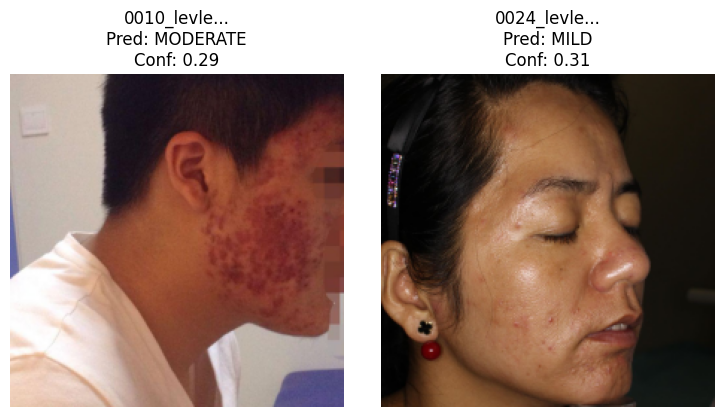

Saved visual check to /workspaces/skin-app/data/segmentation/final_stage3_qc.png


In [19]:
import cv2, numpy as np, pandas as pd
from pathlib import Path
import tensorflow as tf
import matplotlib.pyplot as plt

# --- CONFIG ---
MODEL_PATH = "/workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras"
IMG_DIR    = Path("/workspaces/skin-app/data/seg_qc_30")
OUTPUT_IMG = Path("/workspaces/skin-app/data/segmentation/final_stage3_qc.png")

CLASSES = ["normal", "mild", "moderate", "severe"]

# --- LOAD ---
print(f"Loading {MODEL_PATH}...")
model = tf.keras.models.load_model(MODEL_PATH, compile=False)

# --- PREDICT FUNCTION ---
def get_pred(bgr):
    # Standard center crop (since we are testing the MODEL, not the cropper)
    h, w = bgr.shape[:2]
    side = min(h, w)
    y1, x1 = (h-side)//2, (w-side)//2
    crop = bgr[y1:y1+side, x1:x1+side]
    crop = cv2.resize(crop, (224, 224), interpolation=cv2.INTER_AREA)
    
    # Predict
    rgb = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
    x = rgb.astype(np.float32)[None, ...]
    probs = model.predict(x, verbose=0)[0]
    idx = np.argmax(probs)
    return CLASSES[idx], probs[idx], crop

# --- RUN ON KEY CASES ---
# We look for specific files we know: 0010 (Severe), 0001 (Clean), 0000 (Mild)
target_files = [
    "0010_levle3_70.jpg",   # The problematic Severe case
    "0024_levle1_484.jpg",  # The Lip/Earring case
    "0000_levle0_10.jpg",   # Mild case
    "0003_acnemedium.jpg"   # Moderate case
]

results = []
for fname in target_files:
    # Try finding the file (handling potential extension differences)
    found = list(IMG_DIR.glob(f"{Path(fname).stem}.*"))
    if not found: continue
    
    path = found[0]
    bgr = cv2.imread(str(path))
    pred_cls, conf, crop = get_pred(bgr)
    results.append((fname, pred_cls, conf, crop))

# --- PLOT ---
if not results:
    print("No target images found in QC folder!")
else:
    plt.figure(figsize=(15, 4))
    for i, (fname, pred, conf, img) in enumerate(results):
        plt.subplot(1, 4, i+1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{fname[:10]}...\nPred: {pred.upper()}\nConf: {conf:.2f}")
        plt.axis("off")
    
    plt.tight_layout()
    plt.savefig(OUTPUT_IMG)
    plt.show()
    print(f"Saved visual check to {OUTPUT_IMG}")

In [20]:
import numpy as np
import pandas as pd
from pathlib import Path
import tensorflow as tf

# ----------------------------
# Paths
# ----------------------------
MODEL_PATH = Path("/workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras")
VAL_CSV    = Path("/workspaces/skin-app/data/ACNE04/stage3_val_manifest.csv")
OUT_CSV    = Path("/workspaces/skin-app/data/ACNE04/stage3_val_probs.csv")

CLASS_NAMES = ["normal", "mild", "moderate", "severe"]
NUM_CLASSES = len(CLASS_NAMES)
UNIT_SCALE = False  # keep consistent with your training cell

# ----------------------------
# Load
# ----------------------------
best = tf.keras.models.load_model(str(MODEL_PATH), compile=False)
df_va = pd.read_csv(VAL_CSV)

# ----------------------------
# tf.data for val
# ----------------------------
IMG_SIZE = (224, 224)
BATCH = 32
AUTOTUNE = tf.data.AUTOTUNE

def decode_resize(path):
    img_bytes = tf.io.read_file(path)
    img = tf.image.decode_image(img_bytes, channels=3, expand_animations=False)
    img.set_shape([None, None, 3])
    img = tf.image.resize(img, IMG_SIZE, method="bilinear")
    img = tf.cast(img, tf.float32)
    if UNIT_SCALE:
        img = img / 255.0
    return img

paths = df_va["path"].astype(str).values
y_true = df_va["label"].astype(int).values

ds = tf.data.Dataset.from_tensor_slices(paths)
ds = ds.map(decode_resize, num_parallel_calls=AUTOTUNE).batch(BATCH).prefetch(AUTOTUNE)

# ----------------------------
# Predict
# ----------------------------
probs = best.predict(ds, verbose=1)
pred = np.argmax(probs, axis=1)

dfp = pd.DataFrame({
    "path": paths,
    "y_true": y_true,
    "y_pred": pred,
})
for i, n in enumerate(CLASS_NAMES):
    dfp[f"p_{n}"] = probs[:, i]

dfp.to_csv(OUT_CSV, index=False)
print("\nWrote:", OUT_CSV)

# ----------------------------
# 1) p_severe stats by GT class
# ----------------------------
print("\n=== p_severe stats by GT class ===")
for c in range(NUM_CLASSES):
    sub = dfp[dfp["y_true"] == c]["p_severe"].values
    if len(sub) == 0:
        continue
    print(f"{CLASS_NAMES[c]:>8s} | n={len(sub):3d} | mean={sub.mean():.4f} | median={np.median(sub):.4f} | max={sub.max():.4f}")

# ----------------------------
# 2) Severe override threshold sweep
# Rule: if p_severe >= T => predict severe else argmax
# ----------------------------
def eval_override(T):
    y_hat = pred.copy()
    y_hat[dfp["p_severe"].values >= T] = 3  # force severe
    # severe precision/recall
    tp = np.sum((y_true == 3) & (y_hat == 3))
    fp = np.sum((y_true != 3) & (y_hat == 3))
    fn = np.sum((y_true == 3) & (y_hat != 3))
    prec = tp / (tp + fp + 1e-9)
    rec  = tp / (tp + fn + 1e-9)
    return tp, fp, fn, prec, rec

print("\n=== Severe override sweep ===")
for T in [0.05, 0.10, 0.15, 0.20, 0.25, 0.30]:
    tp, fp, fn, prec, rec = eval_override(T)
    print(f"T={T:0.2f} | TP={tp:2d} FP={fp:3d} FN={fn:2d} | severe_precision={prec:.3f} severe_recall={rec:.3f}")

# ----------------------------
# 3) Show top-10 val images by p_severe (for visual QC)
# ----------------------------
top = dfp.sort_values("p_severe", ascending=False).head(10).copy()
top["gt_name"] = top["y_true"].map({i:n for i,n in enumerate(CLASS_NAMES)})
top["pred_name"] = top["y_pred"].map({i:n for i,n in enumerate(CLASS_NAMES)})

print("\n=== Top-10 by p_severe ===")
print(top[["path","gt_name","pred_name","p_severe","p_moderate","p_mild","p_normal"]].to_string(index=False))


22/22 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step

Wrote: /workspaces/skin-app/data/ACNE04/stage3_val_probs.csv

=== p_severe stats by GT class ===
  normal | n=497 | mean=0.1671 | median=0.1484 | max=0.2933
    mild | n=125 | mean=0.2540 | median=0.2602 | max=0.2890
moderate | n= 35 | mean=0.2504 | median=0.2620 | max=0.2929
  severe | n= 19 | mean=0.2370 | median=0.2663 | max=0.2894

=== Severe override sweep ===
T=0.05 | TP=19 FP=647 FN= 0 | severe_precision=0.029 severe_recall=1.000
T=0.10 | TP=17 FP=505 FN= 2 | severe_precision=0.033 severe_recall=0.895
T=0.15 | TP=16 FP=399 FN= 3 | severe_precision=0.039 severe_recall=0.842
T=0.20 | TP=15 FP=349 FN= 4 | severe_precision=0.041 severe_recall=0.789
T=0.25 | TP=13 FP=282 FN= 6 | severe_precision=0.044 severe_recall=0.684
T=0.30 | TP= 0 FP=  1 FN=19 | severe_precision=0.000 severe_recall=0.000

=== Top-10 by p_severe ===
                                                                path  gt_name pred_name  p_severe  p_moderate   p_mild  p_no

In [21]:
# ============================================================
# STAGE 3b (FULL CELL): Balanced sampling + Alpha-Focal
# Goal: make "severe" win argmax when appropriate
# Inputs: stage3_train_manifest.csv / stage3_val_manifest.csv
# Output: acne4_stage3b_balanced_sampling_alphafocal.keras
# ============================================================

import numpy as np
import pandas as pd
from pathlib import Path
import tensorflow as tf

# ----------------------------
# Paths
# ----------------------------
BASE_MODEL_PATH = Path("/workspaces/skin-app/data/artifacts/acne4_stage2_labelsmooth.keras")
TRAIN_CSV = Path("/workspaces/skin-app/data/ACNE04/stage3_train_manifest.csv")
VAL_CSV   = Path("/workspaces/skin-app/data/ACNE04/stage3_val_manifest.csv")
OUT_MODEL = Path("/workspaces/skin-app/data/artifacts/acne4_stage3b_balanced_sampling_alphafocal.keras")

CLASS_NAMES = ["normal", "mild", "moderate", "severe"]
NUM_CLASSES = len(CLASS_NAMES)

# ----------------------------
# Settings
# ----------------------------
IMG_SIZE = (224, 224)
BATCH = 32
SEED = 1337

EPOCHS_HEAD = 10
EPOCHS_LASTBLOCK = 10   # set 0 to skip
LR_HEAD = 3e-4
LR_LAST = 1e-4

GAMMA = 2.0
UNIT_SCALE = False  # keep consistent with your prior training (0..255 float32)

# Balanced sampling: equal probability per class
SAMPLE_WEIGHTS = [0.25, 0.25, 0.25, 0.25]

# ----------------------------
# Load manifests
# ----------------------------
df_tr = pd.read_csv(TRAIN_CSV)
df_va = pd.read_csv(VAL_CSV)

print("Train counts:\n", df_tr["label"].value_counts().sort_index())
print("\nVal counts:\n", df_va["label"].value_counts().sort_index())

# ----------------------------
# Alpha (class weights inside focal)
# Use inverse frequency, normalized to mean=1.0
# ----------------------------
counts = df_tr["label"].value_counts().sort_index().reindex(range(NUM_CLASSES)).astype(float)
inv = 1.0 / (counts + 1e-9)
alpha = inv / inv.mean()  # mean=1
alpha = alpha.values.astype(np.float32)
print("\nalpha (mean=1):", alpha)

# ----------------------------
# tf.data pipeline
# ----------------------------
AUTOTUNE = tf.data.AUTOTUNE

def decode_resize(path):
    img_bytes = tf.io.read_file(path)
    img = tf.image.decode_image(img_bytes, channels=3, expand_animations=False)
    img.set_shape([None, None, 3])
    img = tf.image.resize(img, IMG_SIZE, method="bilinear")
    img = tf.cast(img, tf.float32)
    if UNIT_SCALE:
        img = img / 255.0
    return img

def make_ds_from_df(df, training: bool):
    paths = df["path"].astype(str).values
    labels = df["label"].astype(np.int32).values
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    if training:
        ds = ds.shuffle(min(len(df), 8000), seed=SEED, reshuffle_each_iteration=True)

    def _map(p, y):
        x = decode_resize(p)
        return x, y

    return ds.map(_map, num_parallel_calls=AUTOTUNE)

# Per-class datasets for balanced sampling
ds_by_class = []
for c in range(NUM_CLASSES):
    sub = df_tr[df_tr["label"] == c]
    ds_c = make_ds_from_df(sub, training=True).repeat()
    ds_by_class.append(ds_c)

ds_tr_bal = tf.data.Dataset.sample_from_datasets(ds_by_class, weights=SAMPLE_WEIGHTS, seed=SEED)
ds_tr_bal = ds_tr_bal.batch(BATCH).prefetch(AUTOTUNE)

ds_va = make_ds_from_df(df_va, training=False).batch(BATCH).prefetch(AUTOTUNE)

# We control epoch length explicitly
steps_per_epoch = int(np.ceil(len(df_tr) / BATCH))
val_steps = int(np.ceil(len(df_va) / BATCH))
print("\nsteps_per_epoch:", steps_per_epoch, "val_steps:", val_steps)

# ----------------------------
# Alpha-balanced sparse focal loss
# L = alpha_y * (1-pt)^gamma * -log(pt)
# ----------------------------
alpha_tf = tf.constant(alpha, dtype=tf.float32)

def sparse_alpha_focal(gamma=2.0, num_classes=4):
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.int32)
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0 - 1e-7)

        # pt: prob of true class
        y_onehot = tf.one_hot(y_true, depth=num_classes)
        pt = tf.reduce_sum(y_onehot * y_pred, axis=-1)

        # alpha_y
        a = tf.gather(alpha_tf, y_true)

        ce = -tf.math.log(pt)
        w = tf.pow(1.0 - pt, gamma)
        return a * w * ce
    return loss

# ----------------------------
# Load base model, freeze, train head
# ----------------------------
model = tf.keras.models.load_model(str(BASE_MODEL_PATH), compile=False)

for layer in model.layers:
    layer.trainable = False

for layer in model.layers[-25:]:
    if isinstance(layer, (tf.keras.layers.Dense,
                          tf.keras.layers.Dropout,
                          tf.keras.layers.BatchNormalization,
                          tf.keras.layers.LayerNormalization)):
        layer.trainable = True

print("\nTrainable layers (phase 1):", sum(l.trainable for l in model.layers), "/", len(model.layers))

model.compile(
    optimizer=tf.keras.optimizers.Adam(LR_HEAD),
    loss=sparse_alpha_focal(gamma=GAMMA, num_classes=NUM_CLASSES),
    metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name="acc")]
)

ckpt = tf.keras.callbacks.ModelCheckpoint(
    filepath=str(OUT_MODEL),
    monitor="val_acc",
    mode="max",
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)
early = tf.keras.callbacks.EarlyStopping(
    monitor="val_acc",
    mode="max",
    patience=3,
    restore_best_weights=True,
    verbose=1
)

print("\n=== Phase 1: Head-only (balanced sampling + alpha-focal) ===")
model.fit(
    ds_tr_bal,
    validation_data=ds_va,
    epochs=EPOCHS_HEAD,
    steps_per_epoch=steps_per_epoch,
    validation_steps=val_steps,
    callbacks=[ckpt, early],
    verbose=1
)

# ----------------------------
# Phase 2: unfreeze last block
# ----------------------------
if EPOCHS_LASTBLOCK > 0:
    for layer in model.layers[-30:]:
        layer.trainable = True

    print("\nTrainable layers (phase 2):", sum(l.trainable for l in model.layers), "/", len(model.layers))

    model.compile(
        optimizer=tf.keras.optimizers.Adam(LR_LAST),
        loss=sparse_alpha_focal(gamma=GAMMA, num_classes=NUM_CLASSES),
        metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name="acc")]
    )

    print("\n=== Phase 2: Unfreeze last block ===")
    model.fit(
        ds_tr_bal,
        validation_data=ds_va,
        epochs=EPOCHS_LASTBLOCK,
        steps_per_epoch=steps_per_epoch,
        validation_steps=val_steps,
        callbacks=[ckpt, early],
        verbose=1
    )

print("\nSaved best model to:", OUT_MODEL)

# ----------------------------
# Evaluate on VAL: confusion + recall
# ----------------------------
best = tf.keras.models.load_model(str(OUT_MODEL), compile=False)

y_true_all, y_pred_all = [], []
for xb, yb in ds_va:
    pb = best.predict(xb, verbose=0)
    y_pred_all.append(np.argmax(pb, axis=1))
    y_true_all.append(yb.numpy())

y_true = np.concatenate(y_true_all)
y_pred = np.concatenate(y_pred_all)

cm = tf.math.confusion_matrix(y_true, y_pred, num_classes=NUM_CLASSES).numpy()
print("\nConfusion matrix (rows=true, cols=pred) order:", CLASS_NAMES)
print(cm)

recalls = {}
for i, name in enumerate(CLASS_NAMES):
    denom = cm[i, :].sum()
    recalls[name] = (cm[i, i] / denom) if denom > 0 else np.nan

print("\nPer-class recall:", recalls)
print("Macro recall:", float(np.nanmean(list(recalls.values()))))


Train counts:
 label
0    1986
1     498
2     140
3      77
Name: count, dtype: int64

Val counts:
 label
0    497
1    125
2     35
3     19
Name: count, dtype: int64

alpha (mean=1): [0.08895635 0.35475364 1.2619094  2.2943807 ]

steps_per_epoch: 85 val_steps: 22

Trainable layers (phase 1): 7 / 161

=== Phase 1: Head-only (balanced sampling + alpha-focal) ===
Epoch 1/10
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - acc: 0.2699 - loss: 0.7313
Epoch 1: val_acc improved from None to 0.68047, saving model to /workspaces/skin-app/data/artifacts/acne4_stage3b_balanced_sampling_alphafocal.keras

Epoch 1: finished saving model to /workspaces/skin-app/data/artifacts/acne4_stage3b_balanced_sampling_alphafocal.keras
85/85 ━━━━━━━━━━━━━━━━━━━━ 21s 200ms/step - acc: 0.2824 - loss: 0.5911 - val_acc: 0.6805 - val_loss: 0.1863
Epoch 2/10
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - acc: 0.2779 - loss: 0.4964
Epoch 2: val_acc did not improve from 0.68047
85/85 ━━━━━━━━━━━━━━━━━━━━ 14s 165ms/step - acc: 

2025-12-30 16:01:10.715811: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [22]:
import numpy as np
import pandas as pd
from pathlib import Path
import tensorflow as tf

VAL_CSV = Path("/workspaces/skin-app/data/ACNE04/stage3_val_manifest.csv")

MODEL_PATHS = [
    ("/workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras", "stage3"),
    ("/workspaces/skin-app/data/artifacts/acne4_stage3b_balanced_sampling_alphafocal.keras", "stage3b"),
]

IMG_SIZE = (224, 224)
BATCH = 32
UNIT_SCALE = False  # keep consistent with your training cells

df = pd.read_csv(VAL_CSV)
paths = df["path"].astype(str).values
y_true = df["label"].astype(int).values

AUTOTUNE = tf.data.AUTOTUNE

def decode_resize(path):
    img_bytes = tf.io.read_file(path)
    img = tf.image.decode_image(img_bytes, channels=3, expand_animations=False)
    img.set_shape([None, None, 3])
    img = tf.image.resize(img, IMG_SIZE, method="bilinear")
    img = tf.cast(img, tf.float32)
    if UNIT_SCALE:
        img = img / 255.0
    return img

ds = tf.data.Dataset.from_tensor_slices(paths)
ds = ds.map(decode_resize, num_parallel_calls=AUTOTUNE).batch(BATCH).prefetch(AUTOTUNE)

def auc_binary(y_bin, score):
    m = tf.keras.metrics.AUC(curve="ROC")
    m.update_state(y_bin.astype(np.float32), score.astype(np.float32))
    return float(m.result().numpy())

print("Val size:", len(y_true), "counts:", dict(pd.Series(y_true).value_counts().sort_index()))
print("")

for mp, name in MODEL_PATHS:
    mp = Path(mp)
    if not mp.exists():
        print(name, "MISSING:", mp)
        continue

    model = tf.keras.models.load_model(str(mp), compile=False)
    probs = model.predict(ds, verbose=0)  # (N,4) softmax
    pred = np.argmax(probs, axis=1)

    p_norm, p_mild, p_mod, p_sev = probs[:,0], probs[:,1], probs[:,2], probs[:,3]

    # Binary labels
    y_sev = (y_true == 3).astype(np.int32)
    y_mod = (y_true == 2).astype(np.int32)

    auc_sev = auc_binary(y_sev, p_sev)
    auc_mod = auc_binary(y_mod, p_mod)

    # Argmax severe rate
    sev_argmax_recall = float(np.mean((pred == 3)[y_true == 3])) if np.any(y_true == 3) else np.nan
    sev_argmax_rate_all = float(np.mean(pred == 3))

    # Distribution separation quick stats
    sev_scores_pos = p_sev[y_true == 3]
    sev_scores_neg = p_sev[y_true != 3]

    print(f"=== {name} ===")
    print("model:", mp)
    print(f"AUC severe-vs-rest (using p_severe): {auc_sev:.3f}")
    print(f"AUC moderate-vs-rest (using p_moderate): {auc_mod:.3f}")
    print(f"Argmax severe recall (on true severe): {sev_argmax_recall:.3f}")
    print(f"Argmax severe rate (overall): {sev_argmax_rate_all:.3f}")
    print(f"p_severe mean(pos severe)={sev_scores_pos.mean():.4f} | mean(neg)={sev_scores_neg.mean():.4f}")
    print(f"p_severe median(pos)={np.median(sev_scores_pos):.4f} | median(neg)={np.median(sev_scores_neg):.4f}")
    print(f"p_severe max(pos)={sev_scores_pos.max():.4f} | max(neg)={sev_scores_neg.max():.4f}")
    print("")


Val size: 676 counts: {0: 497, 1: 125, 2: 35, 3: 19}

=== stage3 ===
model: /workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras
AUC severe-vs-rest (using p_severe): 0.728
AUC moderate-vs-rest (using p_moderate): 0.749
Argmax severe recall (on true severe): 0.000
Argmax severe rate (overall): 0.001
p_severe mean(pos severe)=0.2370 | mean(neg)=0.1881
p_severe median(pos)=0.2663 | median(neg)=0.2195
p_severe max(pos)=0.2894 | max(neg)=0.2933

=== stage3b ===
model: /workspaces/skin-app/data/artifacts/acne4_stage3b_balanced_sampling_alphafocal.keras
AUC severe-vs-rest (using p_severe): 0.726
AUC moderate-vs-rest (using p_moderate): 0.748
Argmax severe recall (on true severe): 0.000
Argmax severe rate (overall): 0.001
p_severe mean(pos severe)=0.2354 | mean(neg)=0.1992
p_severe median(pos)=0.2553 | median(neg)=0.2218
p_severe max(pos)=0.2788 | max(neg)=0.2840



In [23]:
import numpy as np
import pandas as pd

CSV = "/workspaces/skin-app/data/ACNE04/stage3_val_probs.csv"
df = pd.read_csv(CSV)

# Expect columns: y_true, y_pred, p_normal, p_mild, p_moderate, p_severe
need = {"y_true","y_pred","p_normal","p_mild","p_moderate","p_severe"}
missing = need - set(df.columns)
if missing:
    raise ValueError(f"Missing columns in {CSV}: {missing}")

y_true = df["y_true"].astype(int).values
y_pred = df["y_pred"].astype(int).values

p_norm = df["p_normal"].values
p_sev  = df["p_severe"].values

SEV = 3
is_sev = (y_true == SEV)

def eval_flag(flag):
    tp = int(np.sum(flag & is_sev))
    fp = int(np.sum(flag & (~is_sev)))
    fn = int(np.sum((~flag) & is_sev))
    prec = tp / (tp + fp + 1e-9)
    rec  = tp / (tp + fn + 1e-9)
    rate = float(np.mean(flag))
    return tp, fp, fn, prec, rec, rate

rows = []
# thresholds to search (your observed p_severe range is ~0.14–0.29)
thr_grid = np.linspace(0.18, 0.295, 24)
normal_max_grid = [None, 0.25, 0.20, 0.15, 0.10]

for thr in thr_grid:
    for nmax in normal_max_grid:
        # Candidate pool restriction: exclude predicted normal
        flag = (p_sev >= thr) & (y_pred != 0)
        # Optional: also require p_normal to be low
        if nmax is not None:
            flag = flag & (p_norm <= nmax)

        tp, fp, fn, prec, rec, rate = eval_flag(flag)
        rows.append({
            "thr": float(thr),
            "normal_max": nmax if nmax is not None else "None",
            "TP": tp, "FP": fp, "FN": fn,
            "sev_precision": prec,
            "sev_recall": rec,
            "flag_rate": rate
        })

out = pd.DataFrame(rows)

# Show best candidates for different recall targets (minimize flag_rate first, then maximize precision)
targets = [1.0, 0.9, 0.8, 0.7]
print("Severe count:", int(is_sev.sum()), "/", len(df), "\n")

for t in targets:
    cand = out[out["sev_recall"] >= t].copy()
    if len(cand) == 0:
        print(f"No rule reached severe recall >= {t}")
        continue
    cand = cand.sort_values(["flag_rate","sev_precision"], ascending=[True, False]).head(8)
    print(f"=== Best rules with severe recall >= {t} ===")
    print(cand.to_string(index=False))
    print("")


Severe count: 19 / 676 

No rule reached severe recall >= 1.0
No rule reached severe recall >= 0.9
No rule reached severe recall >= 0.8
No rule reached severe recall >= 0.7


In [24]:
import numpy as np
import pandas as pd

CSV = "/workspaces/skin-app/data/ACNE04/stage3_val_probs.csv"
df = pd.read_csv(CSV)

y_true = df["y_true"].astype(int).values
p_norm = df["p_normal"].values
p_sev  = df["p_severe"].values

SEV = 3
is_sev = (y_true == SEV)

def eval_flag(flag):
    tp = int(np.sum(flag & is_sev))
    fp = int(np.sum(flag & (~is_sev)))
    fn = int(np.sum((~flag) & is_sev))
    prec = tp / (tp + fp + 1e-9)
    rec  = tp / (tp + fn + 1e-9)
    rate = float(np.mean(flag))
    return tp, fp, fn, prec, rec, rate

rows = []

# Wider threshold range (you saw useful thresholds as low as 0.10–0.25)
thr_grid = np.linspace(0.08, 0.28, 41)

# Normal guards (tighter guard = fewer false positives)
normal_max_grid = [None, 0.30, 0.25, 0.20, 0.15, 0.10]

for thr in thr_grid:
    for nmax in normal_max_grid:
        # Severe alert rule (no y_pred constraint)
        flag = (p_sev >= thr)
        if nmax is not None:
            flag = flag & (p_norm <= nmax)

        tp, fp, fn, prec, rec, rate = eval_flag(flag)
        rows.append({
            "thr": float(thr),
            "normal_max": nmax if nmax is not None else "None",
            "TP": tp, "FP": fp, "FN": fn,
            "sev_precision": prec,
            "sev_recall": rec,
            "flag_rate": rate
        })

out = pd.DataFrame(rows)

print("Severe count:", int(is_sev.sum()), "/", len(df), "\n")

# Show best rules for recall targets
for t in [1.0, 0.9, 0.8, 0.7]:
    cand = out[out["sev_recall"] >= t].copy()
    if len(cand) == 0:
        print(f"No rule reached severe recall >= {t}")
        continue
    # Prefer low flag rate first, then higher precision
    cand = cand.sort_values(["flag_rate","sev_precision"], ascending=[True, False]).head(10)
    print(f"=== Best rules with severe recall >= {t} ===")
    print(cand.to_string(index=False))
    print("")

# Also: best options under common flag-rate budgets
for budget in [0.05, 0.10, 0.15, 0.20]:
    cand = out[out["flag_rate"] <= budget].copy()
    if len(cand) == 0:
        print(f"No rules under flag_rate <= {budget}")
        continue
    cand = cand.sort_values(["sev_recall","sev_precision"], ascending=[False, False]).head(10)
    print(f"=== Best rules with flag_rate <= {budget} ===")
    print(cand.to_string(index=False))
    print("")


Severe count: 19 / 676 

No rule reached severe recall >= 1.0
=== Best rules with severe recall >= 0.9 ===
  thr normal_max  TP  FP  FN  sev_precision  sev_recall  flag_rate
0.095       None  18 515   1       0.033771    0.947368   0.788462
0.090       None  18 533   1       0.032668    0.947368   0.815089
0.085       None  18 563   1       0.030981    0.947368   0.859467
0.080       None  19 610   0       0.030207    1.000000   0.930473

=== Best rules with severe recall >= 0.8 ===
  thr normal_max  TP  FP  FN  sev_precision  sev_recall  flag_rate
0.185       None  16 354   3       0.043243    0.842105   0.547337
0.180       None  16 361   3       0.042440    0.842105   0.557692
0.175       None  16 367   3       0.041775    0.842105   0.566568
0.170       None  16 375   3       0.040921    0.842105   0.578402
0.165       None  16 384   3       0.040000    0.842105   0.591716
0.160       None  16 388   3       0.039604    0.842105   0.597633
0.155       None  16 394   3       0.039024

In [26]:
import numpy as np, pandas as pd
import tensorflow as tf

CSV = "/workspaces/skin-app/data/ACNE04/stage3_val_probs.csv"
df = pd.read_csv(CSV)

# Choose one:
# A (≈3% alerts):  THR = 0.280
# B (≈10% alerts): THR = 0.270
THR = 0.265


y_true = df["y_true"].astype(int).values
y_pred = df["y_pred"].astype(int).values
p_sev  = df["p_severe"].values

SEV = 3
flag = (p_sev >= THR)

# Option 1 (recommended): keep 4-class prediction, add severe_alert flag
df_out = df.copy()
df_out["severe_alert"] = flag.astype(int)

# Option 2: override prediction to severe when flagged (NOT recommended unless you really want it)
# y_pred_over = y_pred.copy()
# y_pred_over[flag] = SEV
# df_out["y_pred_over"] = y_pred_over

# Evaluate alert quality
tp = int(np.sum(flag & (y_true == SEV)))
fp = int(np.sum(flag & (y_true != SEV)))
fn = int(np.sum((~flag) & (y_true == SEV)))
prec = tp / (tp + fp + 1e-9)
rec  = tp / (tp + fn + 1e-9)

print("THR:", THR)
print("Alert rate:", float(np.mean(flag)))
print("TP FP FN:", tp, fp, fn)
print("Severe-alert precision:", prec)
print("Severe-alert recall:", rec)

OUT = f"/workspaces/skin-app/data/ACNE04/stage3_val_severe_alert_thr_{THR:.3f}.csv"
df_out.to_csv(OUT, index=False)
print("Wrote:", OUT)


THR: 0.265
Alert rate: 0.17899408284023668
TP FP FN: 11 110 8
Severe-alert precision: 0.0909090909083396
Severe-alert recall: 0.5789473683905817
Wrote: /workspaces/skin-app/data/ACNE04/stage3_val_severe_alert_thr_0.265.csv


In [27]:
import numpy as np

CLASS_NAMES = ["normal","mild","moderate","severe"]

def severity_with_severe_alert(probs_4, thr_severe_alert=0.265):
    """
    probs_4: np.ndarray shape (4,) softmax probabilities in order:
             [p_normal, p_mild, p_moderate, p_severe]
    Returns:
      pred_name: str
      pred_idx: int
      conf: float
      severe_alert: bool
      severe_score: float
    """
    probs_4 = np.asarray(probs_4, dtype=np.float32).reshape(-1)
    assert probs_4.shape[0] == 4, "Expected 4-class probs"

    pred_idx = int(np.argmax(probs_4))
    pred_name = CLASS_NAMES[pred_idx]
    conf = float(probs_4[pred_idx])

    severe_score = float(probs_4[3])
    severe_alert = (severe_score >= float(thr_severe_alert))

    return pred_name, pred_idx, conf, bool(severe_alert), severe_score


# ---------- Quick sanity test on your saved val CSV ----------
import pandas as pd

CSV = "/workspaces/skin-app/data/ACNE04/stage3_val_probs.csv"
df = pd.read_csv(CSV)

# build probs array from columns
P = df[["p_normal","p_mild","p_moderate","p_severe"]].values
y_true = df["y_true"].astype(int).values

alerts = np.array([severity_with_severe_alert(p, 0.265)[3] for p in P], dtype=bool)

tp = int(np.sum(alerts & (y_true==3)))
fp = int(np.sum(alerts & (y_true!=3)))
fn = int(np.sum((~alerts) & (y_true==3)))

print("Severe alert @ THR=0.265")
print("Alert rate:", float(np.mean(alerts)))
print("TP FP FN:", tp, fp, fn)
print("Recall:", tp/(tp+fn+1e-9))
print("Precision:", tp/(tp+fp+1e-9))


Severe alert @ THR=0.265
Alert rate: 0.17899408284023668
TP FP FN: 11 110 8
Recall: 0.5789473683905817
Precision: 0.0909090909083396


In [28]:
import cv2
import numpy as np
import tensorflow as tf
from pathlib import Path

# --- CONFIG ---
MODEL_PATH = "/workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras"
IMG_DIR    = Path("/workspaces/skin-app/data/seg_qc_30")
SEVERE_THR = 0.265  # The safety threshold we validated

# Key files to check
files_to_test = [
    "0010_levle3_70.jpg",   # The Severe case (Failed before?)
    "0024_levle1_484.jpg",  # The Lip/Earring case (Should be Mild)
    "0000_levle0_10.jpg",   # Clear Mild case
    "0003_acnemedium.jpg"   # Moderate case
]

# --- LOAD ---
print(f"Loading {MODEL_PATH}...")
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
CLASSES = ["Normal", "Mild", "Moderate", "Severe"]

def predict_with_safety(img_bgr):
    # 1. Preprocess
    img = cv2.resize(img_bgr, (224, 224), interpolation=cv2.INTER_AREA)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    tensor = img.astype(np.float32)[None, ...]
    
    # 2. Predict
    probs = model.predict(tensor, verbose=0)[0]
    p_severe = float(probs[3])
    pred_idx = int(np.argmax(probs))
    std_label = CLASSES[pred_idx]
    
    # 3. Apply Safety Logic
    final_label = std_label
    action = "Home Care" if pred_idx <= 1 else "Doctor"
    triggered = False
    
    if p_severe >= SEVERE_THR:
        triggered = True
        # Force escalation if it was low risk
        if pred_idx <= 1:
            final_label = f"{std_label} (High Risk Alert!)"
            action = "Doctor (Safety Override)"
        else:
            final_label = f"{std_label} (Confirmed)"
            
    return std_label, final_label, action, p_severe, triggered

# --- RUN ---
print(f"{'FILENAME':<20} | {'RAW PRED':<10} | {'P_SEV':<6} | {'FINAL OUTCOME':<30} | {'ACTION'}")
print("-" * 95)

for fname in files_to_test:
    # Handle slight name variations if needed
    found = list(IMG_DIR.glob(f"{Path(fname).stem}*"))
    if not found:
        print(f"{fname:<20} | NOT FOUND")
        continue
        
    path = found[0]
    img = cv2.imread(str(path))
    if img is None: continue
        
    raw, final, act, p_sev, trig = predict_with_safety(img)
    
    flag_mark = "[!]" if trig else "   "
    print(f"{fname[:20]:<20} | {raw:<10} | {p_sev:.3f}  | {flag_mark} {final:<26} | {act}")

Loading /workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras...
FILENAME             | RAW PRED   | P_SEV  | FINAL OUTCOME                  | ACTION
-----------------------------------------------------------------------------------------------
0010_levle3_70.jpg   | Moderate   | 0.257  |     Moderate                   | Doctor
0024_levle1_484.jpg  | Mild       | 0.266  | [!] Mild (High Risk Alert!)    | Doctor (Safety Override)
0000_levle0_10.jpg   | NOT FOUND
0003_acnemedium.jpg  | Moderate   | 0.291  | [!] Moderate (Confirmed)       | Doctor


Loading /workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras...


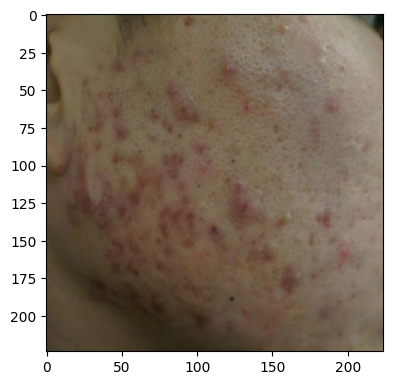

In [29]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from pathlib import Path

# --- CONFIG ---
MODEL_PATH = "/workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras"
IMG_DIR    = Path("/workspaces/skin-app/data/seg_qc_30")
SEVERE_THR = 0.265

# Files to visual check
target_files = [
    "0010_levle3_70.jpg",   # Severe (Should trigger Alert)
    "0024_levle1_484.jpg",  # Mild/Normal (Should NOT trigger)
    "0000_levle0_10.jpg",   # Clear Mild (Should NOT trigger)
    "0003_acnemedium.jpg"   # Moderate (Should be Doctor)
]

# --- LOAD ---
print(f"Loading {MODEL_PATH}...")
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
CLASSES = ["Normal", "Mild", "Moderate", "Severe"]

def get_diagnosis(img_bgr):
    # Preprocess
    img = cv2.resize(img_bgr, (224, 224), interpolation=cv2.INTER_AREA)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    tensor = img_rgb.astype(np.float32)[None, ...]
    
    # Predict
    probs = model.predict(tensor, verbose=0)[0]
    p_severe = float(probs[3])
    pred_idx = int(np.argmax(probs))
    label = CLASSES[pred_idx]
    
    # Safety Logic
    alert = False
    if p_severe >= SEVERE_THR:
        alert = True
        # Visual Label Logic
        if pred_idx <= 1:
            label = f"⚠️ {label} -> HIGH RISK"
        else:
            label = f"{label} (Confirmed)"
            
    return img_rgb, label, p_severe, alert

# --- PLOT ---
plt.figure(figsize=(20, 5))

found_count = 0
for i, fname in enumerate(target_files):
    # Find file
    fpath = list(IMG_DIR.glob(f"{Path(fname).stem}*"))
    if not fpath: continue
    fpath = fpath[0]
    
    img_bgr = cv2.imread(str(fpath))
    if img_bgr is None: continue
    
    # Get Result
    img_rgb, label, p_sev, is_alert = get_diagnosis(img_bgr)
    
    # Plot
    plt.subplot(1, 4, found_count + 1)
    plt.imshow(img_rgb)
    
    # Color code

Loading /workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras...
Could not find file: 0000_levle0_10.jpg


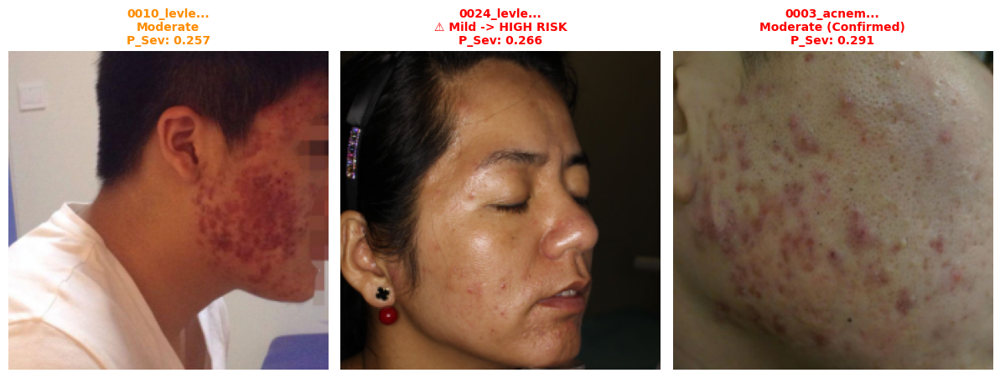

In [30]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from pathlib import Path

# --- CONFIG ---
MODEL_PATH = "/workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras"
IMG_DIR    = Path("/workspaces/skin-app/data/seg_qc_30")
SEVERE_THR = 0.265

# Files to check (Using the exact ones you listed)
target_files = [
    "0010_levle3_70.jpg",   # Severe
    "0024_levle1_484.jpg",  # Mild (triggered alert)
    "0000_levle0_10.jpg",   # Mild (missing in your last run, let's try to find it)
    "0003_acnemedium.jpg"   # Moderate
]

# --- LOAD ---
print(f"Loading {MODEL_PATH}...")
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
CLASSES = ["Normal", "Mild", "Moderate", "Severe"]

def get_diagnosis_visual(img_bgr):
    # Preprocess
    img_resized = cv2.resize(img_bgr, (224, 224), interpolation=cv2.INTER_AREA)
    img_rgb = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)
    tensor = img_rgb.astype(np.float32)[None, ...]
    
    # Predict
    probs = model.predict(tensor, verbose=0)[0]
    p_severe = float(probs[3])
    pred_idx = int(np.argmax(probs))
    label = CLASSES[pred_idx]
    
    # Safety Logic
    is_alert = False
    if p_severe >= SEVERE_THR:
        is_alert = True
        if pred_idx <= 1: # If it was Mild/Normal
            label = f"⚠️ {label} -> HIGH RISK"
        else:
            label = f"{label} (Confirmed)"
            
    return img_rgb, label, p_severe, is_alert

# --- PLOT ---
plt.figure(figsize=(16, 5))

found_count = 0
for i, fname in enumerate(target_files):
    # Flexible search for the file
    matches = list(IMG_DIR.glob(f"{Path(fname).stem}*"))
    if not matches:
        print(f"Could not find file: {fname}")
        continue
    fpath = matches[0]
    
    img_bgr = cv2.imread(str(fpath))
    if img_bgr is None: continue
    
    # Get Data
    img_rgb, label, p_sev, is_alert = get_diagnosis_visual(img_bgr)
    
    # Plotting
    plt.subplot(1, 4, found_count + 1)
    plt.imshow(img_rgb)
    
    # Color Coding
    # Red = Safety Alert Triggered
    # Orange = Moderate/Severe (Doctor Action)
    # Green = Normal/Mild (Home Action)
    
    title_color = "green"
    if is_alert:
        title_color = "red"
    elif "Moderate" in label or "Severe" in label:
        title_color = "darkorange"
        
    plt.title(f"{fname[:10]}...\n{label}\nP_Sev: {p_sev:.3f}", 
              color=title_color, fontweight='bold', fontsize=10)
    plt.axis("off")
    found_count += 1

plt.tight_layout()
plt.show()

In [31]:
import numpy as np

CLASS_NAMES = ["normal", "mild", "moderate", "severe"]

def _softmax(x):
    x = np.asarray(x, dtype=np.float32).reshape(-1)
    x = x - np.max(x)
    ex = np.exp(x)
    return ex / (np.sum(ex) + 1e-9)

def to_probs4(model_out_4):
    """
    Robustly convert model output to softmax probs.
    If it already looks like probs (all in [0,1] and sums ~1), return as-is.
    Otherwise treat as logits and softmax it.
    """
    v = np.asarray(model_out_4, dtype=np.float32).reshape(-1)
    assert v.shape[0] == 4, f"Expected 4 values, got {v.shape}"
    s = float(v.sum())
    is_prob_like = (v.min() >= -1e-4) and (v.max() <= 1.0001) and (abs(s - 1.0) <= 1e-2)
    return v if is_prob_like else _softmax(v)

def severity_with_severe_alert(model_out_4, thr_severe_alert=0.265):
    probs = to_probs4(model_out_4)
    pred_idx = int(np.argmax(probs))
    pred_label = CLASS_NAMES[pred_idx]
    pred_conf = float(probs[pred_idx])

    p_severe = float(probs[3])
    severe_alert = (p_severe >= float(thr_severe_alert))

    return {
        "severity_pred": pred_label,
        "severity_pred_idx": pred_idx,
        "severity_conf": pred_conf,
        "p_severe": p_severe,
        "severe_alert": bool(severe_alert),
        "severe_alert_thr": float(thr_severe_alert),
        "probs": probs.tolist(),
    }

# ---- Example usage in your controller ----
# out = model5.predict(x, verbose=0)[0]   # could be logits or probs
# sev = severity_with_severe_alert(out, thr_severe_alert=0.265)
# print(sev)


In [33]:
import numpy as np
import tensorflow as tf
from pathlib import Path

MODEL_PATH = Path("/workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras")  # or your live Model-5
assert MODEL_PATH.exists(), f"Missing: {MODEL_PATH}"

model = tf.keras.models.load_model(str(MODEL_PATH), compile=False)

# Dummy input: 1 image of zeros (224x224x3). This is only to inspect output format.
x = np.zeros((1, 224, 224, 3), dtype=np.float32)

y = model.predict(x, verbose=0)[0].astype(np.float32)
s = float(y.sum())

print("Raw output:", y)
print("Sum:", s)
print("Min/Max:", float(y.min()), float(y.max()))
print("Looks like probs? ", (y.min() >= -1e-4) and (y.max() <= 1.0001) and (abs(s - 1.0) <= 1e-2))


Raw output: [0.1258524  0.27363726 0.31050205 0.2900082 ]
Sum: 0.9999998807907104
Min/Max: 0.12585240602493286 0.3105020523071289
Looks like probs?  True


In [34]:
import numpy as np

CLASS_NAMES = ["normal", "mild", "moderate", "severe"]
SEVERE_ALERT_THR = 0.265  # locked operating point from your sweep

def severity_controller_from_probs(probs4, thr_severe_alert=SEVERE_ALERT_THR):
    """
    probs4: iterable length-4 softmax probabilities in order:
            [p_normal, p_mild, p_moderate, p_severe]
    Returns a dict suitable for your pipeline JSON/logging.
    """
    p = np.asarray(probs4, dtype=np.float32).reshape(-1)
    if p.shape[0] != 4:
        raise ValueError(f"Expected 4 probs, got shape {p.shape}")

    # Optional sanity (won't crash, just renormalize if tiny drift)
    s = float(p.sum())
    if not (0.98 <= s <= 1.02):
        p = p / (s + 1e-9)

    pred_idx = int(np.argmax(p))
    pred_label = CLASS_NAMES[pred_idx]
    pred_conf = float(p[pred_idx])

    p_severe = float(p[3])
    severe_alert = bool(p_severe >= float(thr_severe_alert))

    return {
        "severity_pred": pred_label,
        "severity_pred_idx": pred_idx,
        "severity_conf": pred_conf,
        "p_normal": float(p[0]),
        "p_mild": float(p[1]),
        "p_moderate": float(p[2]),
        "p_severe": p_severe,
        "severe_alert": severe_alert,
        "severe_alert_thr": float(thr_severe_alert),
    }

# ---------------- Example usage ----------------
# probs = model5.predict(x, verbose=0)[0]  # already softmax, as you verified
# sev_out = severity_controller_from_probs(probs)
# if sev_out["severe_alert"]:
#     # show "possible severe" / "seek clinician advice" banner
# print(sev_out)


In [35]:
import json
from pathlib import Path

MODEL_SRC = Path("/workspaces/skin-app/data/artifacts/acne4_stage3_balanced_focal.keras")
assert MODEL_SRC.exists(), f"Missing: {MODEL_SRC}"

# Optionally copy/rename to a stable production name
MODEL_DST = Path("/workspaces/skin-app/data/artifacts/acne5_severity_stage3.keras")

THR_JSON = Path("/workspaces/skin-app/data/artifacts/acne5_severe_alert_threshold.json")
THR = 0.265

# Copy model to stable name (so future experiments don't overwrite paths)
if not MODEL_DST.exists():
    MODEL_DST.write_bytes(MODEL_SRC.read_bytes())

# Write threshold config
THR_JSON.write_text(json.dumps({
    "severe_alert_thr": THR,
    "model_path": str(MODEL_DST),
    "notes": "Stage-3 balanced focal. Severe-alert is a separate flag; do not override argmax class."
}, indent=2))

print("Locked model:", MODEL_DST)
print("Wrote threshold JSON:", THR_JSON)


Locked model: /workspaces/skin-app/data/artifacts/acne5_severity_stage3.keras
Wrote threshold JSON: /workspaces/skin-app/data/artifacts/acne5_severe_alert_threshold.json
